# Data Pre-Processing

# importing data

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")
import pickle

In [3]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("technika148/football-database")

print("Path to dataset files:", path)

Path to dataset files: /home/leoadmin/.cache/kagglehub/datasets/technika148/football-database/versions/1


In [4]:
import os

In [5]:
dir_list = os.listdir(path) 
   
print("Files and directories in '", path, "' :")  
   
# print the list 
print(dir_list)

Files and directories in ' /home/leoadmin/.cache/kagglehub/datasets/technika148/football-database/versions/1 ' :
['leagues.csv', 'teamstats.csv', 'teams.csv', 'shots.csv', 'players.csv', 'appearances.csv', 'games.csv']


# Creating data frames from data

In [6]:
# Get all CSV files in the directory
csv_files = [f for f in os.listdir(path) if f.endswith('.csv')]

# Create a dictionary to store DataFrames
dfs = {}

# Load each CSV file into a DataFrame
for file in csv_files:
    file_path = os.path.join(path, file)
    df_name = file.replace(".csv", "")  # Use filename (without .csv) as the dictionary key
    dfs[df_name] = pd.read_csv(file_path, encoding='latin1')

# Display keys (i.e., names of loaded DataFrames)
print("Loaded DataFrames:", dfs.keys())

Loaded DataFrames: dict_keys(['leagues', 'teamstats', 'teams', 'shots', 'players', 'appearances', 'games'])


In [7]:
display(dfs['appearances'].head())
display(dfs['appearances'].info())

,gameID,playerID,goals,ownGoals,shots,xGoals,xGoalsChain,xGoalsBuildup,assists,keyPasses,xAssists,position,positionOrder,yellowCard,redCard,time,substituteIn,substituteOut,leagueID
0,81,560,0,0,0,0.0,0.000000,0.000000,0,0,0.000000,GK,1,0,0,90,0,0,1
1,81,557,0,0,0,0.0,0.106513,0.106513,0,1,0.106513,DR,2,0,0,82,222605,0,1
2,81,548,0,0,0,0.0,0.127738,0.127738,0,0,0.000000,DC,3,0,0,90,0,0,1
3,81,628,0,0,0,0.0,0.106513,0.106513,0,0,0.000000,DC,3,0,0,90,0,0,1
4,81,1006,0,0,0,0.0,0.021225,0.021225,0,0,0.000000,DL,4,0,0,90,0,0,1


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 356513 entries, 0 to 356512
Data columns (total 19 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   gameID         356513 non-null  int64  
 1   playerID       356513 non-null  int64  
 2   goals          356513 non-null  int64  
 3   ownGoals       356513 non-null  int64  
 4   shots          356513 non-null  int64  
 5   xGoals         356513 non-null  float64
 6   xGoalsChain    356513 non-null  float64
 7   xGoalsBuildup  356513 non-null  float64
 8   assists        356513 non-null  int64  
 9   keyPasses      356513 non-null  int64  
 10  xAssists       356513 non-null  float64
 11  position       356513 non-null  object 
 12  positionOrder  356513 non-null  int64  
 13  yellowCard     356513 non-null  int64  
 14  redCard        356513 non-null  int64  
 15  time           356513 non-null  int64  
 16  substituteIn   356513 non-null  int64  
 17  substituteOut  356513 non-nul

None

In [8]:
display(dfs['games'].head())
display(dfs['games'].info())

,gameID,leagueID,season,date,homeTeamID,awayTeamID,homeGoals,awayGoals,homeProbability,drawProbability,...,PSA,WHH,WHD,WHA,VCH,VCD,VCA,PSCH,PSCD,PSCA
0,81,1,2015,2015-08-08 15:45:00,89,82,1,0,0.2843,0.3999,...,5.90,1.62,3.6,6.00,1.67,4.00,5.75,1.64,4.07,6.04
1,82,1,2015,2015-08-08 18:00:00,73,71,0,1,0.3574,0.3500,...,4.27,1.91,3.5,4.00,2.00,3.50,4.20,1.82,3.88,4.70
2,83,1,2015,2015-08-08 18:00:00,72,90,2,2,0.2988,0.4337,...,5.62,1.73,3.5,5.00,1.73,3.90,5.40,1.75,3.76,5.44
3,84,1,2015,2015-08-08 18:00:00,75,77,4,2,0.6422,0.2057,...,4.34,2.00,3.1,2.70,2.00,3.40,4.33,1.79,3.74,5.10
4,85,1,2015,2015-08-08 18:00:00,79,78,1,3,0.1461,0.2159,...,3.08,2.60,3.1,2.88,2.60,3.25,3.00,2.46,3.39,3.14


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12680 entries, 0 to 12679
Data columns (total 34 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   gameID             12680 non-null  int64  
 1   leagueID           12680 non-null  int64  
 2   season             12680 non-null  int64  
 3   date               12680 non-null  object 
 4   homeTeamID         12680 non-null  int64  
 5   awayTeamID         12680 non-null  int64  
 6   homeGoals          12680 non-null  int64  
 7   awayGoals          12680 non-null  int64  
 8   homeProbability    12680 non-null  float64
 9   drawProbability    12680 non-null  float64
 10  awayProbability    12680 non-null  float64
 11  homeGoalsHalfTime  12680 non-null  int64  
 12  awayGoalsHalfTime  12680 non-null  int64  
 13  B365H              12675 non-null  float64
 14  B365D              12675 non-null  float64
 15  B365A              12675 non-null  float64
 16  BWH                126

None

In [9]:
display(dfs['leagues'].head())
display(dfs['leagues'].info())

,leagueID,name,understatNotation
0,1,Premier League,EPL
1,2,Serie A,Serie_A
2,3,Bundesliga,Bundesliga
3,4,La Liga,La_liga
4,5,Ligue 1,Ligue_1


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5 entries, 0 to 4
Data columns (total 3 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   leagueID           5 non-null      int64 
 1   name               5 non-null      object
 2   understatNotation  5 non-null      object
dtypes: int64(1), object(2)
memory usage: 248.0+ bytes


None

In [10]:
display(dfs['players'].head())
display(dfs['players'].info())

,playerID,name
0,560,Sergio Romero
1,557,Matteo Darmian
2,548,Daley Blind
3,628,Chris Smalling
4,1006,Luke Shaw


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7659 entries, 0 to 7658
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   playerID  7659 non-null   int64 
 1   name      7659 non-null   object
dtypes: int64(1), object(1)
memory usage: 119.8+ KB


None

In [11]:
display(dfs['teams'].head())
display(dfs['teams'].info())

,teamID,name
0,71,Aston Villa
1,72,Everton
2,74,Southampton
3,75,Leicester
4,76,West Bromwich Albion


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 146 entries, 0 to 145
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   teamID  146 non-null    int64 
 1   name    146 non-null    object
dtypes: int64(1), object(1)
memory usage: 2.4+ KB


None

In [12]:
display(dfs['shots'].head())
display(dfs['shots'].info())

,gameID,shooterID,assisterID,minute,situation,lastAction,shotType,shotResult,xGoal,positionX,positionY
0,81,554,NaN,27,DirectFreekick,Standard,LeftFoot,BlockedShot,0.104347,0.794,0.421
1,81,555,631.0,27,SetPiece,Pass,RightFoot,BlockedShot,0.064342,0.860,0.627
2,81,554,629.0,35,OpenPlay,Pass,LeftFoot,BlockedShot,0.057157,0.843,0.333
3,81,554,NaN,35,OpenPlay,Tackle,LeftFoot,MissedShots,0.092141,0.848,0.533
4,81,555,654.0,40,OpenPlay,BallRecovery,RightFoot,BlockedShot,0.035742,0.812,0.707


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 324543 entries, 0 to 324542
Data columns (total 11 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   gameID      324543 non-null  int64  
 1   shooterID   324543 non-null  int64  
 2   assisterID  240199 non-null  float64
 3   minute      324543 non-null  int64  
 4   situation   324543 non-null  object 
 5   lastAction  324543 non-null  object 
 6   shotType    324543 non-null  object 
 7   shotResult  324543 non-null  object 
 8   xGoal       324543 non-null  float64
 9   positionX   324543 non-null  float64
 10  positionY   324543 non-null  float64
dtypes: float64(4), int64(3), object(4)
memory usage: 27.2+ MB


None

In [13]:
display(dfs['teamstats'].head())
display(dfs['teamstats'].info())

,gameID,teamID,season,date,location,goals,xGoals,shots,shotsOnTarget,deep,ppda,fouls,corners,yellowCards,redCards,result
0,81,89,2015,2015-08-08 15:45:00,h,1,0.627539,9,1,4,13.8261,12,1,2.0,0,W
1,81,82,2015,2015-08-08 15:45:00,a,0,0.674600,9,4,10,8.2188,12,2,3.0,0,L
2,82,73,2015,2015-08-08 18:00:00,h,0,0.876106,11,2,11,6.9000,13,6,3.0,0,L
3,82,71,2015,2015-08-08 18:00:00,a,1,0.782253,7,3,2,11.8462,13,3,4.0,0,W
4,83,72,2015,2015-08-08 18:00:00,h,2,0.604226,10,5,5,6.6500,7,8,1.0,0,D


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25360 entries, 0 to 25359
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   gameID         25360 non-null  int64  
 1   teamID         25360 non-null  int64  
 2   season         25360 non-null  int64  
 3   date           25360 non-null  object 
 4   location       25360 non-null  object 
 5   goals          25360 non-null  int64  
 6   xGoals         25360 non-null  float64
 7   shots          25360 non-null  int64  
 8   shotsOnTarget  25360 non-null  int64  
 9   deep           25360 non-null  int64  
 10  ppda           25360 non-null  float64
 11  fouls          25360 non-null  int64  
 12  corners        25360 non-null  int64  
 13  yellowCards    25359 non-null  float64
 14  redCards       25360 non-null  int64  
 15  result         25360 non-null  object 
dtypes: float64(3), int64(10), object(3)
memory usage: 3.1+ MB


None

In [14]:
dfs['appearances']['positionOrder'].value_counts()

17    77563
3     56289
9     44453
15    34094
1     25358
4     20559
2     20556
7     16903
12    13542
10     8390
8      8389
11     6923
13     6923
14     5211
16     5211
5      3075
6      3074
Name: positionOrder, dtype: int64

# Having a look into the dfs

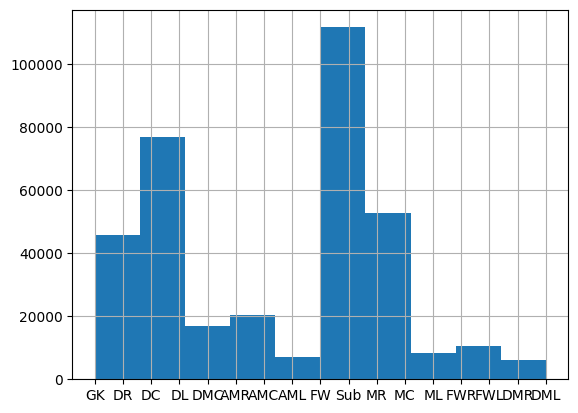

In [15]:
#dfs['appearances']['positionOrder'].hist()
dfs['appearances']['position'].hist()
plt.show()

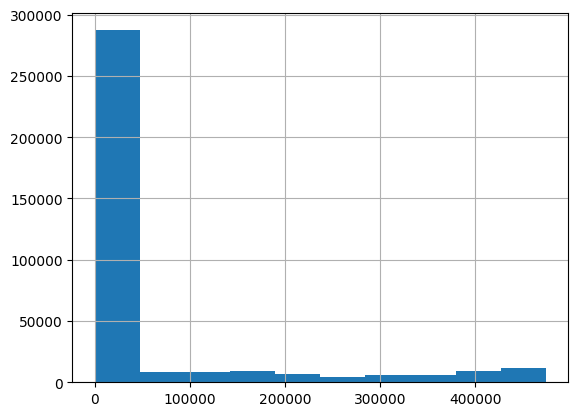

In [16]:
dfs['appearances']['substituteIn'].hist()
plt.show()

In [17]:
display(dfs['appearances']['substituteOut'].value_counts())

0         278954
316647         1
317386         1
317387         1
317382         1
           ...  
33206          1
33209          1
33186          1
33194          1
474074         1
Name: substituteOut, Length: 77560, dtype: int64

In [18]:
display(dfs['appearances']['substituteIn'].value_counts())

0         278954
316652         1
317393         1
317391         1
317392         1
           ...  
33210          1
33212          1
33197          1
33196          1
474075         1
Name: substituteIn, Length: 77560, dtype: int64

In [19]:
display(dfs['appearances'][['gameID','playerID','substituteIn','substituteOut','time']])

,gameID,playerID,substituteIn,substituteOut,time
0,81,560,0,0,90
1,81,557,222605,0,82
2,81,548,0,0,90
3,81,628,0,0,90
4,81,1006,0,0,90
...,...,...,...,...,...
356508,16135,3509,0,0,90
356509,16135,4882,0,0,90
356510,16135,5786,0,0,90
356511,16135,8997,474075,0,78


changing the logic of substitute in/out and repalcing it to be binary

In [20]:
# 1. Drop the 'position' column
df_appearances = dfs['appearances'].drop(columns=['position'])

# 2. Create binary columns from 'substituteIn' and 'substituteOut'
df_appearances['subOut'] = df_appearances['substituteIn'].apply(
    lambda x: 1 if x not in [None, '', 0] else 0
)
df_appearances['subIn'] = df_appearances['substituteOut'].apply(
    lambda x: 1 if x not in [None, '', 0] else 0
)

# 3. Drop the original 'substituteIn' and 'substituteOut' columns
df_appearances.drop(columns=['substituteIn', 'substituteOut'], inplace=True)

# Now df_appearances retains the 'positionOrder' (and any other columns except 'position')

In [21]:
# Get current column order
cols = list(df_appearances.columns)

# Remove subOut, subIn from wherever they currently are
cols.remove('subOut')
cols.remove('subIn')

# Find positions of 'time' and 'leagueID'
pos_time = cols.index('time')
pos_league = cols.index('leagueID')

# Insert subOut, subIn right after 'time' (and before leagueID, if leagueID comes after time)
new_cols = (
    cols[:pos_time+1]      # everything up to and including 'time'
    + ['subOut', 'subIn']  # our two new columns
    + cols[pos_time+1:]    # the remainder of the columns
)

# Reassign columns in this new order
df_appearances = df_appearances[new_cols]

In [22]:
display(df_appearances.head(30))
display(df_appearances.info())

,gameID,playerID,goals,ownGoals,shots,xGoals,xGoalsChain,xGoalsBuildup,assists,keyPasses,xAssists,positionOrder,yellowCard,redCard,time,subOut,subIn,leagueID
0,81,560,0,0,0,0.000000,0.000000,0.000000,0,0,0.000000,1,0,0,90,0,0,1
1,81,557,0,0,0,0.000000,0.106513,0.106513,0,1,0.106513,2,0,0,82,1,0,1
2,81,548,0,0,0,0.000000,0.127738,0.127738,0,0,0.000000,3,0,0,90,0,0,1
3,81,628,0,0,0,0.000000,0.106513,0.106513,0,0,0.000000,3,0,0,90,0,0,1
4,81,1006,0,0,0,0.000000,0.021225,0.021225,0,0,0.000000,4,0,0,90,0,0,1
5,81,551,0,0,0,0.000000,0.163670,0.163670,0,0,0.000000,7,0,0,90,0,0,1
6,81,654,0,0,0,0.000000,0.035742,0.000000,0,1,0.035742,7,0,0,61,1,0,1
7,81,554,0,0,3,0.253645,0.255811,0.106513,0,0,0.000000,11,1,0,90,0,0,1
8,81,555,0,0,3,0.121309,0.056967,0.000000,0,0,0.000000,12,0,0,69,1,0,1
9,81,631,0,0,1,0.103004,0.124229,0.021225,0,1,0.064342,13,0,0,90,0,0,1


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 356513 entries, 0 to 356512
Data columns (total 18 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   gameID         356513 non-null  int64  
 1   playerID       356513 non-null  int64  
 2   goals          356513 non-null  int64  
 3   ownGoals       356513 non-null  int64  
 4   shots          356513 non-null  int64  
 5   xGoals         356513 non-null  float64
 6   xGoalsChain    356513 non-null  float64
 7   xGoalsBuildup  356513 non-null  float64
 8   assists        356513 non-null  int64  
 9   keyPasses      356513 non-null  int64  
 10  xAssists       356513 non-null  float64
 11  positionOrder  356513 non-null  int64  
 12  yellowCard     356513 non-null  int64  
 13  redCard        356513 non-null  int64  
 14  time           356513 non-null  int64  
 15  subOut         356513 non-null  int64  
 16  subIn          356513 non-null  int64  
 17  leagueID       356513 non-nul

None

extracting odds and probabilities to a separate df, it is not a good feature for modeling

In [23]:
# Create df_games with game stats (columns 0 to 12, which already includes 'gameID')
df_games = dfs['games'].iloc[:, :13]

# Drop the probability columns from df_games
df_games = df_games.drop(columns=['homeProbability', 'drawProbability', 'awayProbability'])

# Create df_games_odds with betting odds (columns 13 to 33)
df_games_odds = dfs['games'].iloc[:, 13:34].copy()

# Insert each column individually
df_games_odds.insert(0, 'gameID', dfs['games']['gameID'])
df_games_odds.insert(1, 'homeProbability', dfs['games']['homeProbability'])
df_games_odds.insert(2, 'drawProbability', dfs['games']['drawProbability'])
df_games_odds.insert(3, 'awayProbability', dfs['games']['awayProbability'])

# Optionally, display the DataFrames to verify they both contain the desired columns
display(df_games.head())
display(df_games_odds.head())



,gameID,leagueID,season,date,homeTeamID,awayTeamID,homeGoals,awayGoals,homeGoalsHalfTime,awayGoalsHalfTime
0,81,1,2015,2015-08-08 15:45:00,89,82,1,0,1,0
1,82,1,2015,2015-08-08 18:00:00,73,71,0,1,0,0
2,83,1,2015,2015-08-08 18:00:00,72,90,2,2,0,1
3,84,1,2015,2015-08-08 18:00:00,75,77,4,2,3,0
4,85,1,2015,2015-08-08 18:00:00,79,78,1,3,0,1


,gameID,homeProbability,drawProbability,awayProbability,B365H,B365D,B365A,BWH,BWD,BWA,...,PSA,WHH,WHD,WHA,VCH,VCD,VCA,PSCH,PSCD,PSCA
0,81,0.2843,0.3999,0.3158,1.65,4.0,6.00,1.65,4.0,5.50,...,5.90,1.62,3.6,6.00,1.67,4.00,5.75,1.64,4.07,6.04
1,82,0.3574,0.3500,0.2926,2.00,3.6,4.00,2.00,3.3,3.70,...,4.27,1.91,3.5,4.00,2.00,3.50,4.20,1.82,3.88,4.70
2,83,0.2988,0.4337,0.2675,1.70,3.9,5.50,1.70,3.5,5.00,...,5.62,1.73,3.5,5.00,1.73,3.90,5.40,1.75,3.76,5.44
3,84,0.6422,0.2057,0.1521,1.95,3.5,4.33,2.00,3.3,3.75,...,4.34,2.00,3.1,2.70,2.00,3.40,4.33,1.79,3.74,5.10
4,85,0.1461,0.2159,0.6380,2.55,3.3,3.00,2.60,3.2,2.70,...,3.08,2.60,3.1,2.88,2.60,3.25,3.00,2.46,3.39,3.14


having a look at the shots df

In [61]:
df_shots = dfs['shots'].copy()
df_teamstats = dfs['teamstats'].copy()
df_players = dfs['players'].copy()
df_teams = dfs['teams'].copy()

In [28]:
df_shots

,gameID,shooterID,assisterID,minute,situation,lastAction,shotType,shotResult,xGoal,positionX,positionY
0,81,554,NaN,27,DirectFreekick,Standard,LeftFoot,BlockedShot,0.104347,0.794,0.421
1,81,555,631.0,27,SetPiece,Pass,RightFoot,BlockedShot,0.064342,0.860,0.627
2,81,554,629.0,35,OpenPlay,Pass,LeftFoot,BlockedShot,0.057157,0.843,0.333
3,81,554,NaN,35,OpenPlay,Tackle,LeftFoot,MissedShots,0.092141,0.848,0.533
4,81,555,654.0,40,OpenPlay,BallRecovery,RightFoot,BlockedShot,0.035742,0.812,0.707
...,...,...,...,...,...,...,...,...,...,...,...
324538,16135,6615,8651.0,19,SetPiece,Aerial,Head,MissedShots,0.039172,0.899,0.511
324539,16135,6615,8651.0,54,SetPiece,Cross,LeftFoot,Goal,0.372809,0.902,0.482
324540,16135,3464,NaN,70,OpenPlay,None,LeftFoot,MissedShots,0.009242,0.738,0.774
324541,16135,8651,4882.0,72,OpenPlay,Cross,Head,BlockedShot,0.045374,0.882,0.543


there isn't a connection between the team and the shooter so it is complicated to map a shot mapping of each game for each team

In [29]:
display(df_shots['situation'].value_counts())
display(df_shots['lastAction'].value_counts())
display(df_shots['shotType'].value_counts())
display(df_shots['shotResult'].value_counts())
display(df_shots['positionX'].value_counts())
display(df_shots['positionY'].value_counts())

OpenPlay          237543
FromCorner         47208
SetPiece           21354
DirectFreekick     14451
Penalty             3987
Name: situation, dtype: int64

Pass               115861
Cross               46175
None                36896
Aerial              23882
Standard            18438
TakeOn              17331
Chipped             16959
Rebound             13735
HeadPass             7997
BallRecovery         7256
Throughball          6459
BallTouch            4995
LayOff               3076
Dispossessed         1780
Tackle                761
Foul                  533
CornerAwarded         464
Interception          424
BlockedPass           370
End                   246
Goal                  204
Challenge             140
Clearance             121
OffsidePass            93
Card                   86
GoodSkill              67
Save                   60
SubstitutionOn         48
FormationChange        16
Start                  14
KeeperPickup           13
Error                  11
Punch                   7
OffsideProvoked         7
ShieldBallOpp           5
KeeperSweeper           4
ChanceMissed            3
PenaltyFaced            2
CrossNotClai

RightFoot        166121
LeftFoot         102195
Head              54960
OtherBodyPart      1267
Name: shotType, dtype: int64

MissedShots    126980
BlockedShot     79992
SavedShot       75801
Goal            34498
ShotOnPost       6258
OwnGoal          1014
Name: shotResult, dtype: int64

0.885    5844
0.913    2425
0.910    2367
0.917    2351
0.919    2321
         ... 
0.116       1
0.377       1
0.382       1
0.424       1
0.365       1
Name: positionX, Length: 813, dtype: int64

0.500    4738
0.534    1740
0.466    1730
0.493    1704
0.487    1698
         ... 
0.127       1
0.915       1
0.989       1
0.058       1
0.133       1
Name: positionY, Length: 930, dtype: int64

In [30]:
print(df_shots['positionX'].describe())
print(df_shots['positionY'].describe())


count    324543.000000
mean          0.843968
std           0.090014
min           0.003000
25%           0.781000
50%           0.863000
75%           0.909000
max           0.999000
Name: positionX, dtype: float64
count    324543.000000
mean          0.504613
std           0.129372
min           0.000000
25%           0.414000
50%           0.501000
75%           0.597000
max           0.997000
Name: positionY, dtype: float64


In [31]:
from itertools import combinations

# Generate all possible pairs of DataFrames
df_pairs = list(combinations(dfs.keys(), 2))

# Create a dictionary to store matching features
matching_features = {}

# Iterate over each pair and find common columns
for df1_name, df2_name in df_pairs:
    df1_columns = set(dfs[df1_name].columns)
    df2_columns = set(dfs[df2_name].columns)
    
    # Find common columns
    common_cols = list(df1_columns & df2_columns)
    
    if common_cols:  # Only store pairs that have common columns
        matching_features[(df1_name, df2_name)] = common_cols

#display(matching_features)

# Convert dictionary to a DataFrame for better visualization
df_matching_features = pd.DataFrame(
    [(pair[0], pair[1], ", ".join(features)) for pair, features in matching_features.items()],
    columns=["DataFrame 1", "DataFrame 2", "Matching Features"]
)

# Display the table
from IPython.display import display
display(df_matching_features)

,DataFrame 1,DataFrame 2,Matching Features
0,leagues,teams,name
1,leagues,players,name
2,leagues,appearances,leagueID
3,leagues,games,leagueID
4,teamstats,teams,teamID
5,teamstats,shots,gameID
6,teamstats,appearances,"xGoals, shots, goals, gameID"
7,teamstats,games,"date, gameID, season"
8,teams,players,name
9,shots,appearances,gameID


In [32]:
# Merge home team stats
df_home_stats = pd.merge(
    df_games[['gameID', 'homeTeamID']],
    df_teamstats,
    left_on=['gameID', 'homeTeamID'],
    right_on=['gameID', 'teamID'],
    how='left'
)

# Drop the duplicate teamID column from df_teamstats and rename columns to indicate home team stats
df_home_stats = df_home_stats.drop(columns=['teamID'])
df_home_stats = df_home_stats.rename(columns=lambda x: 'home_' + x if x not in ['gameID', 'homeTeamID'] else x)


In [33]:
# Merge away team stats
df_away_stats = pd.merge(
    df_games[['gameID', 'awayTeamID']],
    df_teamstats,
    left_on=['gameID', 'awayTeamID'],
    right_on=['gameID', 'teamID'],
    how='left'
)

# Drop the duplicate teamID column and rename columns to indicate away team stats
df_away_stats = df_away_stats.drop(columns=['teamID'])
df_away_stats = df_away_stats.rename(columns=lambda x: 'away_' + x if x not in ['gameID', 'awayTeamID'] else x)


In [34]:
# Start with df_games
df_combined = df_games.copy()

# Merge home team stats
df_combined = pd.merge(df_combined, df_home_stats, on=['gameID', 'homeTeamID'], how='left')

# Merge away team stats
df_combined = pd.merge(df_combined, df_away_stats, on=['gameID', 'awayTeamID'], how='left')


In [35]:
def determine_result(row):
    if row['homeGoals'] > row['awayGoals']:
        return 'H'  # Home win
    elif row['homeGoals'] < row['awayGoals']:
        return 'A'  # Away win
    else:
        return 'D'  # Draw

df_combined['gameresult'] = df_combined.apply(determine_result, axis=1)


In [36]:
display(df_combined)


,gameID,leagueID,season,date,homeTeamID,awayTeamID,homeGoals,awayGoals,homeGoalsHalfTime,awayGoalsHalfTime,...,away_shots,away_shotsOnTarget,away_deep,away_ppda,away_fouls,away_corners,away_yellowCards,away_redCards,away_result,gameresult
0,81,1,2015,2015-08-08 15:45:00,89,82,1,0,1,0,...,9,4,10,8.2188,12,2,3.0,0,L,H
1,82,1,2015,2015-08-08 18:00:00,73,71,0,1,0,0,...,7,3,2,11.8462,13,3,4.0,0,W,A
2,83,1,2015,2015-08-08 18:00:00,72,90,2,2,0,1,...,11,5,4,17.1579,13,2,2.0,0,D,D
3,84,1,2015,2015-08-08 18:00:00,75,77,4,2,3,0,...,11,5,6,9.5556,17,3,4.0,0,L,H
4,85,1,2015,2015-08-08 18:00:00,79,78,1,3,0,1,...,11,7,10,10.6250,20,4,0.0,0,W,A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12675,16131,5,2020,2021-05-23 19:00:00,168,166,1,2,1,1,...,8,5,3,8.3529,11,5,2.0,0,W,A
12676,16132,5,2020,2021-05-23 19:00:00,177,176,1,2,1,1,...,12,5,4,27.0000,6,2,1.0,0,W,A
12677,16133,5,2020,2021-05-23 19:00:00,163,235,2,0,1,0,...,9,2,0,39.7273,10,3,0.0,0,L,H
12678,16134,5,2020,2021-05-23 19:00:00,175,181,0,1,0,1,...,10,2,3,14.7200,10,3,0.0,0,W,A


Connecting playerID to teamID for further work on shots

In [37]:
# Merge appearances with games on gameID
merged_df = df_appearances.merge(df_games, on="gameID", how="left")


def assign_teams(df):
    """
    Assign teams based on positionOrder.
    - The first sequence (1-17) belongs to the first team.
    - When positionOrder resets to 1, the second team starts.
    """
    team_labels = []
    current_team = 1  # Start with the first team
    
    for idx, row in df.iterrows():
        if row["positionOrder"] == 1 and len(team_labels) >= 1:
            current_team = 2  # Switch to second team when GK (1) appears again
        team_labels.append(current_team)
    
    df["teamAssignment"] = team_labels
    return df
merged_df = merged_df.groupby("gameID", group_keys=False).apply(assign_teams)
merged_df["teamID"] = merged_df.apply(
    lambda row: row["homeTeamID"] if row["teamAssignment"] == 1 else row["awayTeamID"], axis=1
)


# Step 2: Handle substitutions
merged_df["subIn"] = merged_df["subIn"].notnull()

# Step 3: Verify positionOrder 12-17 assignment using substitution data
merged_df["isValidSubstitute"] = merged_df.apply(
    lambda row: row["subIn"] if 12 <= row["positionOrder"] <= 17 else True, axis=1
)

# Step 4: Ensure players are assigned to only one team per game
merged_df["teamConsistencyCheck"] = merged_df.groupby(["playerID", "gameID"])["teamID"].transform("nunique") == 1

# Step 5: Verify goals consistency
def verify_goals(merged_df, games):
    team_goals = merged_df.groupby(["gameID", "teamAssignment"])["goals"].sum().reset_index(name="teamGoals")
    own_goals = merged_df.groupby(["gameID", "teamAssignment"])["ownGoals"].sum().reset_index(name="ownGoals")
    
    team_goals = team_goals.merge(own_goals, on=["gameID", "teamAssignment"], how="left").fillna(0)
    team_goals["adjustedGoals"] = team_goals["teamGoals"] + team_goals.groupby("gameID")["ownGoals"].shift(-1, fill_value=0)
    
    team_goals = team_goals.merge(games[["gameID", "homeTeamID", "awayTeamID", "homeGoals", "awayGoals"]], on="gameID", how="left")
    
    team_goals["teamID_after_Verify"] = team_goals.apply(
        lambda row: row["homeTeamID"] if row["adjustedGoals"] == row["homeGoals"] else row["awayTeamID"], axis=1
    )
    # Merge verification results
    merged_df = merged_df.merge(team_goals[["gameID", "teamAssignment", "teamID_after_Verify"]], on=["gameID", "teamAssignment"], how="left")
    
    # Extract only rows where teamID changed
    discrepancies = merged_df[(merged_df["teamID"] != merged_df["teamID_after_Verify"])&(merged_df['homeGoals']!=merged_df['awayGoals'])][["gameID", "playerID", "teamID", "teamID_after_Verify"]]

    return discrepancies

goal_verification = verify_goals(merged_df, df_games)

# Step 6: Ensure a player is not assigned to more than 3 different teams in a season
player_team_counts = merged_df.groupby(["playerID", "season"])["teamID"].nunique()
valid_players = player_team_counts.index
merged_df = merged_df[merged_df.set_index(["playerID", "season"]).index.isin(valid_players)]

# Step 7: Generate a file with gameID, teamID, playerID for verification
player_game_team_mapping = merged_df[["gameID", "teamID", "playerID"]].drop_duplicates()


In [38]:
player_game_team_mapping

,gameID,teamID,playerID
0,81,89,560
1,81,89,557
2,81,89,548
3,81,89,628
4,81,89,1006
...,...,...,...
356508,16135,179,3509
356509,16135,179,4882
356510,16135,179,5786
356511,16135,179,8997


In [63]:
# Merge player_game_team_mapping with df_players to get player names
player_game_team_mapping = player_game_team_mapping.merge(
    df_players[['playerID', 'name']],  # only keep relevant columns
    on='playerID',
    how='left'
)

# Rename the 'name' column from df_players to 'playerName'
player_game_team_mapping.rename(columns={'name': 'playerName'}, inplace=True)

# Merge again with df_teams to get team names
player_game_team_mapping = player_game_team_mapping.merge(
    df_teams[['teamID', 'name']],  # only keep relevant columns
    on='teamID',
    how='left'
)

# Rename the 'name' column from df_teams to 'teamName'
player_game_team_mapping.rename(columns={'name': 'teamName'}, inplace=True)


In [64]:

# Now player_game_team_mapping has columns:
# [gameID, teamID, playerID, playerName, teamName]
player_game_team_mapping.head()

,gameID,teamID,playerID,playerName,teamName
0,81,89,560,Sergio Romero,Manchester United
1,81,89,557,Matteo Darmian,Manchester United
2,81,89,548,Daley Blind,Manchester United
3,81,89,628,Chris Smalling,Manchester United
4,81,89,1006,Luke Shaw,Manchester United


In [65]:
# Suppose player_game_team_mapping has columns: [gameID, teamID, playerID]

dup_check = (
    player_game_team_mapping
    .groupby(["playerID", "gameID"])["teamID"]
    .nunique()
    .reset_index(name="num_teams")
)

# Filter rows where a single (player, game) has more than 1 unique team
discrepancies = dup_check[dup_check["num_teams"] > 1]

if len(discrepancies) > 0:
    print("Discrepancies found! The following (playerID, gameID) pairs have multiple team assignments:")
    print(discrepancies)
else:
    print("No discrepancies found. Each player is assigned exactly one team per game.")

No discrepancies found. Each player is assigned exactly one team per game.


In [66]:
# { playerID: { gameID: teamID } }
mapping_dict = (
    player_game_team_mapping
    .groupby("playerID")
    .apply(lambda grp: dict(zip(grp["gameID"], grp["teamID"])))
    .to_dict()
)

# Example: Access the team for a given player/game
some_player = 12345
some_game = 67890
team_for_player_in_game = mapping_dict.get(some_player, {}).get(some_game, None)
print(team_for_player_in_game)


None


In [67]:
# Ensure each player in each season has at most 3 distinct teams
team_counts_per_season = merged_df.groupby(["playerID", "season"])["teamID"].nunique()
violations = team_counts_per_season[team_counts_per_season > 3]

if len(violations) > 0:
    print("Players with more than 3 teams in a season found:")
    print(violations)
else:
    print("No season-based team assignment violations found.")


No season-based team assignment violations found.


In [69]:
# Assume unique_pairs has columns ['playerID', 'teamID'].

# 1. Merge player names from df_players
unique_pairs = unique_pairs.merge(
    df_players[['playerID', 'name']],  # only the necessary columns
    on='playerID',
    how='left'
)
unique_pairs.rename(columns={'name': 'playerName'}, inplace=True)

# 2. Merge team names from df_teams
unique_pairs = unique_pairs.merge(
    df_teams[['teamID', 'name']],  # only the necessary columns
    on='teamID',
    how='left'
)
unique_pairs.rename(columns={'name': 'teamName'}, inplace=True)


In [70]:
# Now unique_pairs has columns:
# ['playerID', 'teamID', 'playerName', 'teamName']
display(unique_pairs.drop_duplicates())


,playerID,teamID,playerName,teamName
0,560,89,Sergio Romero,Manchester United
1,557,89,Matteo Darmian,Manchester United
2,548,89,Daley Blind,Manchester United
3,628,89,Chris Smalling,Manchester United
4,1006,89,Luke Shaw,Manchester United
...,...,...,...,...
10101,7396,176,Loic Bessile,Bordeaux
10102,9566,175,Yanis Lhéry,Saint-Etienne
10103,9565,175,Mathys Saban,Saint-Etienne
10104,9568,181,Charles Costes,Dijon


In [74]:
# 1) Create a DataFrame that has one row per player with a list of teamIDs
team_history = (
    player_game_team_mapping
    .groupby("playerID")["teamID"]
    .apply(lambda x: list(set(x)))  # or list(x) if you don't mind duplicates
    .reset_index(name="teams_played_for")
)

# 2) "Explode" so each team in the list becomes its own row
team_history_exploded = team_history.explode("teams_played_for")

# 3) Merge with df_teams to get the team name
team_history_exploded = team_history_exploded.merge(
    df_teams[["teamID", "name"]], 
    left_on="teams_played_for", 
    right_on="teamID", 
    how="left"
)

# Rename the team name column to avoid confusion
team_history_exploded.rename(columns={"name": "teamName"}, inplace=True)

# 4) Re-group or aggregate back to one row per playerID, now listing team names
# Suppose df_players has columns ['playerID', 'name']

team_history_with_names = team_history_with_names.merge(
    df_players[['playerID', 'name']], 
    on='playerID', 
    how='left'
)

# Rename 'name' to 'playerName' for clarity
team_history_with_names.rename(columns={'name': 'playerName'}, inplace=True)

# Optionally reorder columns
team_history_with_names = team_history_with_names[
    ['playerID', 'playerName', 'teams_played_for_names']
]


In [75]:
# Now team_history_with_names has columns:
#   'playerID' and 'teams_played_for_names' (a list of team names)
display(team_history_with_names.head(10))

,playerID,playerName,teams_played_for_names
0,1,Christian Mathenia,"[Darmstadt, Hamburger SV, Nuernberg]"
1,2,György Garics,[Darmstadt]
2,3,Luca Caldirola,"[Werder Bremen, Darmstadt, Benevento]"
3,4,Aytac Sulu,[Darmstadt]
4,5,Fabian Holland,[Darmstadt]
5,6,Marcel Heller,"[Darmstadt, Augsburg]"
6,7,Florian Jungwirth,[Darmstadt]
7,8,Jérôme Gondorf,"[Werder Bremen, Freiburg, Darmstadt]"
8,9,Tobias Kempe,[Darmstadt]
9,10,Jan Rosenthal,[Darmstadt]


In [79]:
display(team_history_with_names[team_history['playerID'] == 841])


,playerID,playerName,teams_played_for_names
810,841,Graziano Pellè,"[Parma Calcio 1913, Southampton]"


creating player-appearance and shots df

In [80]:
# Prepare data for indices calculation
shots_df=df_shots.copy()
appearances_df=df_appearances.copy()
# Merge appearances with shots data based on gameID and playerID (shooterID)
player_shots = shots_df.rename(columns={"shooterID": "playerID"})
merged_df_teams = appearances_df.merge(player_game_team_mapping, on=["gameID", "playerID"], how="left")
merged_df_player = player_shots.merge(player_game_team_mapping, on=["gameID", "playerID"], how="left")


# Define indices calculations
player_performance = merged_df_player.groupby(["gameID","teamID"]).agg(

    total_xGoals=("xGoal", "sum"),
    total_blocked_shots=("shotResult", lambda x: (x == "BlockedShot").sum()),
    total_saved_shots=("shotResult", lambda x: (x == "SavedShot").sum()),
)
# Define indices calculations
team_performance = merged_df_teams.groupby(["gameID","teamID"]).agg(

    teamgoals=("goals", "sum"),
    ownGoals=('ownGoals',"sum"),
    total_shots=("shots", "sum"),
    total_xGoal=("xGoals", "sum"),
    total_assists=("assists", "sum"),
    total_xAssists=("xAssists", "sum"),
    total_key_passes=("keyPasses", "sum"),
    total_xGoalsChain=("xGoalsChain", "sum"),
    total_xGoalsBuildup=("xGoalsBuildup", "sum"),
    total_yellow_cards=("yellowCard", "sum"),
    total_red_cards=("redCard", "sum"),
)

merged_df_teams = team_performance.merge(player_performance, on=["gameID", "teamID"], how="left").reset_index()

In [81]:
merged_df_teams

,gameID,teamID,teamgoals,ownGoals,total_shots,total_xGoal,total_assists,total_xAssists,total_key_passes,total_xGoalsChain,total_xGoalsBuildup,total_yellow_cards,total_red_cards,total_xGoals,total_blocked_shots,total_saved_shots
0,81,82,0,1,9,0.675723,0,0.586365,7,1.745371,0.811549,3,0,0.675723,3.0,4.0
1,81,89,0,0,9,0.627539,0,0.284979,5,1.396328,0.994160,2,0,0.627539,4.0,1.0
2,82,71,1,0,7,0.786230,1,0.560695,4,1.238205,0.736815,4,0,0.786230,2.0,2.0
3,82,73,0,0,11,0.876106,0,0.419975,9,2.159510,1.170894,3,0,0.876106,2.0,2.0
4,83,72,2,0,10,0.604226,2,0.549139,8,1.025550,0.493522,1,0,0.604226,2.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25355,16133,235,0,0,9,0.357583,0,0.216965,6,0.884652,0.544502,0,0,0.357583,0.0,2.0
25356,16134,175,0,0,19,1.484124,0,1.265829,13,4.790546,3.092978,1,0,1.484124,5.0,5.0
25357,16134,181,1,0,10,1.380292,1,0.565077,6,1.256511,0.764512,0,0,1.380292,1.0,1.0
25358,16135,179,1,0,7,0.521913,1,0.470476,4,0.502347,0.421488,1,0,0.521913,2.0,0.0


In [82]:
teamstats=dfs["teamstats"].merge(merged_df_teams,on=['gameID', 'teamID'],how='left')

In [83]:
teamstats

,gameID,teamID,season,date,location,goals,xGoals,shots,shotsOnTarget,deep,...,total_assists,total_xAssists,total_key_passes,total_xGoalsChain,total_xGoalsBuildup,total_yellow_cards,total_red_cards,total_xGoals,total_blocked_shots,total_saved_shots
0,81,89,2015,2015-08-08 15:45:00,h,1,0.627539,9,1,4,...,0,0.284979,5,1.396328,0.994160,2,0,0.627539,4.0,1.0
1,81,82,2015,2015-08-08 15:45:00,a,0,0.674600,9,4,10,...,0,0.586365,7,1.745371,0.811549,3,0,0.675723,3.0,4.0
2,82,73,2015,2015-08-08 18:00:00,h,0,0.876106,11,2,11,...,0,0.419975,9,2.159510,1.170894,3,0,0.876106,2.0,2.0
3,82,71,2015,2015-08-08 18:00:00,a,1,0.782253,7,3,2,...,1,0.560695,4,1.238205,0.736815,4,0,0.786230,2.0,2.0
4,83,72,2015,2015-08-08 18:00:00,h,2,0.604226,10,5,5,...,2,0.549139,8,1.025550,0.493522,1,0,0.604226,2.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25355,16133,235,2020,2021-05-23 19:00:00,a,0,0.357583,9,2,0,...,0,0.216965,6,0.884652,0.544502,0,0,0.357583,0.0,2.0
25356,16134,175,2020,2021-05-23 19:00:00,h,0,1.460500,19,5,6,...,0,1.265829,13,4.790546,3.092978,1,0,1.484124,5.0,5.0
25357,16134,181,2020,2021-05-23 19:00:00,a,1,1.380290,10,2,3,...,1,0.565077,6,1.256511,0.764512,0,0,1.380292,1.0,1.0
25358,16135,225,2020,2021-05-23 19:00:00,h,1,0.323960,6,2,1,...,0,0.074636,4,0.528499,0.205685,1,0,0.323960,0.0,1.0


In [86]:
# for var_name, obj in globals().items():
#     if isinstance(obj, pd.DataFrame):
#         print(f"=== {var_name} ===")
#         print("Shape:", obj.shape)
#         display(obj.head(5))  # Show the first 5 rows
#         print("\n")


create a dictionary of all the dataframes in use

In [87]:
dataframes = {
    "df_appearances": df_appearances,
    "df_games": df_games,
    "df_games_odds": df_games_odds,
    "df_shots": df_shots,
    "df_teamstats": df_teamstats,
    "df_combined": df_combined,
    "player_game_team_mapping": player_game_team_mapping,
    "player_shots": player_shots,
    "player_performance": player_performance,
    "team_performance": team_performance,
    "teamstats": teamstats
}

# Example: Display each DataFrame
for name, df in dataframes.items():
    print(f"=== {name} ===")
    print("Shape:", df.shape)
    display(df.head())
    print("\n")


=== df_appearances ===
Shape: (356513, 18)


,gameID,playerID,goals,ownGoals,shots,xGoals,xGoalsChain,xGoalsBuildup,assists,keyPasses,xAssists,positionOrder,yellowCard,redCard,time,subOut,subIn,leagueID
0,81,560,0,0,0,0.0,0.000000,0.000000,0,0,0.000000,1,0,0,90,0,0,1
1,81,557,0,0,0,0.0,0.106513,0.106513,0,1,0.106513,2,0,0,82,1,0,1
2,81,548,0,0,0,0.0,0.127738,0.127738,0,0,0.000000,3,0,0,90,0,0,1
3,81,628,0,0,0,0.0,0.106513,0.106513,0,0,0.000000,3,0,0,90,0,0,1
4,81,1006,0,0,0,0.0,0.021225,0.021225,0,0,0.000000,4,0,0,90,0,0,1




=== df_games ===
Shape: (12680, 10)


,gameID,leagueID,season,date,homeTeamID,awayTeamID,homeGoals,awayGoals,homeGoalsHalfTime,awayGoalsHalfTime
0,81,1,2015,2015-08-08 15:45:00,89,82,1,0,1,0
1,82,1,2015,2015-08-08 18:00:00,73,71,0,1,0,0
2,83,1,2015,2015-08-08 18:00:00,72,90,2,2,0,1
3,84,1,2015,2015-08-08 18:00:00,75,77,4,2,3,0
4,85,1,2015,2015-08-08 18:00:00,79,78,1,3,0,1




=== df_games_odds ===
Shape: (12680, 25)


,gameID,homeProbability,drawProbability,awayProbability,B365H,B365D,B365A,BWH,BWD,BWA,...,PSA,WHH,WHD,WHA,VCH,VCD,VCA,PSCH,PSCD,PSCA
0,81,0.2843,0.3999,0.3158,1.65,4.0,6.00,1.65,4.0,5.50,...,5.90,1.62,3.6,6.00,1.67,4.00,5.75,1.64,4.07,6.04
1,82,0.3574,0.3500,0.2926,2.00,3.6,4.00,2.00,3.3,3.70,...,4.27,1.91,3.5,4.00,2.00,3.50,4.20,1.82,3.88,4.70
2,83,0.2988,0.4337,0.2675,1.70,3.9,5.50,1.70,3.5,5.00,...,5.62,1.73,3.5,5.00,1.73,3.90,5.40,1.75,3.76,5.44
3,84,0.6422,0.2057,0.1521,1.95,3.5,4.33,2.00,3.3,3.75,...,4.34,2.00,3.1,2.70,2.00,3.40,4.33,1.79,3.74,5.10
4,85,0.1461,0.2159,0.6380,2.55,3.3,3.00,2.60,3.2,2.70,...,3.08,2.60,3.1,2.88,2.60,3.25,3.00,2.46,3.39,3.14




=== df_shots ===
Shape: (324543, 11)


,gameID,shooterID,assisterID,minute,situation,lastAction,shotType,shotResult,xGoal,positionX,positionY
0,81,554,NaN,27,DirectFreekick,Standard,LeftFoot,BlockedShot,0.104347,0.794,0.421
1,81,555,631.0,27,SetPiece,Pass,RightFoot,BlockedShot,0.064342,0.860,0.627
2,81,554,629.0,35,OpenPlay,Pass,LeftFoot,BlockedShot,0.057157,0.843,0.333
3,81,554,NaN,35,OpenPlay,Tackle,LeftFoot,MissedShots,0.092141,0.848,0.533
4,81,555,654.0,40,OpenPlay,BallRecovery,RightFoot,BlockedShot,0.035742,0.812,0.707




=== df_teamstats ===
Shape: (25360, 16)


,gameID,teamID,season,date,location,goals,xGoals,shots,shotsOnTarget,deep,ppda,fouls,corners,yellowCards,redCards,result
0,81,89,2015,2015-08-08 15:45:00,h,1,0.627539,9,1,4,13.8261,12,1,2.0,0,W
1,81,82,2015,2015-08-08 15:45:00,a,0,0.674600,9,4,10,8.2188,12,2,3.0,0,L
2,82,73,2015,2015-08-08 18:00:00,h,0,0.876106,11,2,11,6.9000,13,6,3.0,0,L
3,82,71,2015,2015-08-08 18:00:00,a,1,0.782253,7,3,2,11.8462,13,3,4.0,0,W
4,83,72,2015,2015-08-08 18:00:00,h,2,0.604226,10,5,5,6.6500,7,8,1.0,0,D




=== df_combined ===
Shape: (12680, 39)


,gameID,leagueID,season,date,homeTeamID,awayTeamID,homeGoals,awayGoals,homeGoalsHalfTime,awayGoalsHalfTime,...,away_shots,away_shotsOnTarget,away_deep,away_ppda,away_fouls,away_corners,away_yellowCards,away_redCards,away_result,gameresult
0,81,1,2015,2015-08-08 15:45:00,89,82,1,0,1,0,...,9,4,10,8.2188,12,2,3.0,0,L,H
1,82,1,2015,2015-08-08 18:00:00,73,71,0,1,0,0,...,7,3,2,11.8462,13,3,4.0,0,W,A
2,83,1,2015,2015-08-08 18:00:00,72,90,2,2,0,1,...,11,5,4,17.1579,13,2,2.0,0,D,D
3,84,1,2015,2015-08-08 18:00:00,75,77,4,2,3,0,...,11,5,6,9.5556,17,3,4.0,0,L,H
4,85,1,2015,2015-08-08 18:00:00,79,78,1,3,0,1,...,11,7,10,10.6250,20,4,0.0,0,W,A




=== player_game_team_mapping ===
Shape: (356513, 5)


,gameID,teamID,playerID,playerName,teamName
0,81,89,560,Sergio Romero,Manchester United
1,81,89,557,Matteo Darmian,Manchester United
2,81,89,548,Daley Blind,Manchester United
3,81,89,628,Chris Smalling,Manchester United
4,81,89,1006,Luke Shaw,Manchester United




=== player_shots ===
Shape: (324543, 11)


,gameID,playerID,assisterID,minute,situation,lastAction,shotType,shotResult,xGoal,positionX,positionY
0,81,554,NaN,27,DirectFreekick,Standard,LeftFoot,BlockedShot,0.104347,0.794,0.421
1,81,555,631.0,27,SetPiece,Pass,RightFoot,BlockedShot,0.064342,0.860,0.627
2,81,554,629.0,35,OpenPlay,Pass,LeftFoot,BlockedShot,0.057157,0.843,0.333
3,81,554,NaN,35,OpenPlay,Tackle,LeftFoot,MissedShots,0.092141,0.848,0.533
4,81,555,654.0,40,OpenPlay,BallRecovery,RightFoot,BlockedShot,0.035742,0.812,0.707




=== player_performance ===
Shape: (25349, 3)


total_xGoals  total_blocked_shots  total_saved_shots
gameID teamID                                                      
81     82          0.675723                    3                  4
       89          0.627539                    4                  1
82     71          0.786230                    2                  2
       73          0.876106                    2                  2
83     72          0.604226                    2                  3



=== team_performance ===
Shape: (25360, 11)


teamgoals  ownGoals  total_shots  total_xGoal  total_assists  \
gameID teamID                                                                 
81     82              0         1            9     0.675723              0   
       89              0         0            9     0.627539              0   
82     71              1         0            7     0.786230              1   
       73              0         0           11     0.876106              0   
83     72              2         0           10     0.604226              2   

               total_xAssists  total_key_passes  total_xGoalsChain  \
gameID teamID                                                        
81     82            0.586365                 7           1.745371   
       89            0.284979                 5           1.396328   
82     71            0.560695                 4           1.238205   
       73            0.419975                 9           2.159510   
83     72            0.549139                 8           1.025550   

               total_xGoalsBuildup  total_yellow_cards  total_red_cards  
gameID teamID                                                            
81     82                 0.811549                   3                0  
       89                 0.994160                   2                0  
82     71                 0.736815                   4                0  
       73                 1.170894                   3                0  
83     72                 0.493522                   1                0



=== teamstats ===
Shape: (25360, 30)


,gameID,teamID,season,date,location,goals,xGoals,shots,shotsOnTarget,deep,...,total_assists,total_xAssists,total_key_passes,total_xGoalsChain,total_xGoalsBuildup,total_yellow_cards,total_red_cards,total_xGoals,total_blocked_shots,total_saved_shots
0,81,89,2015,2015-08-08 15:45:00,h,1,0.627539,9,1,4,...,0,0.284979,5,1.396328,0.994160,2,0,0.627539,4.0,1.0
1,81,82,2015,2015-08-08 15:45:00,a,0,0.674600,9,4,10,...,0,0.586365,7,1.745371,0.811549,3,0,0.675723,3.0,4.0
2,82,73,2015,2015-08-08 18:00:00,h,0,0.876106,11,2,11,...,0,0.419975,9,2.159510,1.170894,3,0,0.876106,2.0,2.0
3,82,71,2015,2015-08-08 18:00:00,a,1,0.782253,7,3,2,...,1,0.560695,4,1.238205,0.736815,4,0,0.786230,2.0,2.0
4,83,72,2015,2015-08-08 18:00:00,h,2,0.604226,10,5,5,...,2,0.549139,8,1.025550,0.493522,1,0,0.604226,2.0,3.0


# DATA PROTOCOL

In [88]:
import os

# 1) Ensure the directory "data_protocol" exists (create if not)
os.makedirs("data_protocol", exist_ok=True)

# 2) Loop over each DataFrame in the dictionary
for name, df in dataframes.items():
    # a) Type of data
    df.dtypes.to_excel(f"data_protocol/{name}_datatype.xlsx", sheet_name='data_types')

    # b) Maximum
    df.max().to_excel(f"data_protocol/{name}_max.xlsx", sheet_name='max')

    # c) Minimum
    df.min().to_excel(f"data_protocol/{name}_min.xlsx", sheet_name='min')

    # d) Isnull values
    df.isnull().to_excel(f"data_protocol/{name}_isnull.xlsx", sheet_name='isnull')

    # e) Unique values
    df.nunique().to_excel(f"data_protocol/{name}_nunique.xlsx", sheet_name='nunique')

    print(f"Exported data protocol files for {name}")


Exported data protocol files for df_appearances
Exported data protocol files for df_games
Exported data protocol files for df_games_odds
Exported data protocol files for df_shots
Exported data protocol files for df_teamstats
Exported data protocol files for df_combined
Exported data protocol files for player_game_team_mapping
Exported data protocol files for player_shots
Exported data protocol files for player_performance
Exported data protocol files for team_performance
Exported data protocol files for teamstats


In [89]:
# Create a folder for pickles
os.makedirs("pickles", exist_ok=True)

# Loop through each DataFrame and save it as a pickle
for name, df in dataframes.items():
    pickle_path = f"pickles/{name}.pkl"
    df.to_pickle(pickle_path)
    print(f"Saved {name} to {pickle_path}")


Saved df_appearances to pickles/df_appearances.pkl
Saved df_games to pickles/df_games.pkl
Saved df_games_odds to pickles/df_games_odds.pkl
Saved df_shots to pickles/df_shots.pkl
Saved df_teamstats to pickles/df_teamstats.pkl
Saved df_combined to pickles/df_combined.pkl
Saved player_game_team_mapping to pickles/player_game_team_mapping.pkl
Saved player_shots to pickles/player_shots.pkl
Saved player_performance to pickles/player_performance.pkl
Saved team_performance to pickles/team_performance.pkl
Saved teamstats to pickles/teamstats.pkl


# descriptive statistics

In [120]:
!pip install autoviz

Defaulting to user installation because normal site-packages is not writeable
  Using cached pandas-1.5.3-cp38-cp38-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (11 kB)
  Using cached seaborn-0.12.2-py3-none-any.whl.metadata (5.4 kB)
Using cached pandas-1.5.3-cp38-cp38-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (12.2 MB)
Using cached seaborn-0.12.2-py3-none-any.whl (293 kB)
  Attempting uninstall: pandas
    Found existing installation: pandas 2.0.3
    Uninstalling pandas-2.0.3:
      Successfully uninstalled pandas-2.0.3
  Attempting uninstall: seaborn
    Found existing installation: seaborn 0.13.2
    Uninstalling seaborn-0.13.2:
      Successfully uninstalled seaborn-0.13.2


In [121]:
df.to_csv('mydata.csv', index=False)

Shape of your Data Set loaded: (12680, 39)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  6
    Number of Integer-Categorical Columns =  21
    Number of String-Categorical Columns =  3
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  3
    Number of Date Time Columns =  3
    Number of ID Columns =  1
    Number of Columns to Delete =  2
    39 Predictors classified...
        3 variable(s) removed since they were ID or low-information variables
        List of variables removed: ['gameID', 'home_location', 'away_location']
6 numeric variables i

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
gameID,int64,0.000000,100,81.000000,16135.000000,Possible ID column: drop before modeling step.
leagueID,int64,0.000000,0,1.000000,5.000000,No issue
season,int64,0.000000,0,2014.000000,2020.000000,Possible date-time colum: transform before modeling step.
date,object,0.000000,53,,,No issue
homeTeamID,int64,0.000000,1,71.000000,262.000000,Column has 55 outliers greater than upper bound (256.00) or lower than lower bound(8.00). Cap them or remove them.
awayTeamID,int64,0.000000,1,71.000000,262.000000,Column has 55 outliers greater than upper bound (256.00) or lower than lower bound(8.00). Cap them or remove them.
homeGoals,int64,0.000000,0,0.000000,10.000000,Column has 981 outliers greater than upper bound (3.50) or lower than lower bound(-0.50). Cap them or remove them.
awayGoals,int64,0.000000,0,0.000000,9.000000,Column has 44 outliers greater than upper bound (5.00) or lower than lower bound(-3.00). Cap them or remove them.
homeGoalsHalfTime,int64,0.000000,0,0.000000,6.000000,Column has 403 outliers greater than upper bound (2.50) or lower than lower bound(-1.50). Cap them or remove them.
awayGoalsHalfTime,int64,0.000000,0,0.000000,5.000000,Column has 225 outliers greater than upper bound (2.50) or lower than lower bound(-1.50). Cap them or remove them.


Number of All Scatter Plots = 21


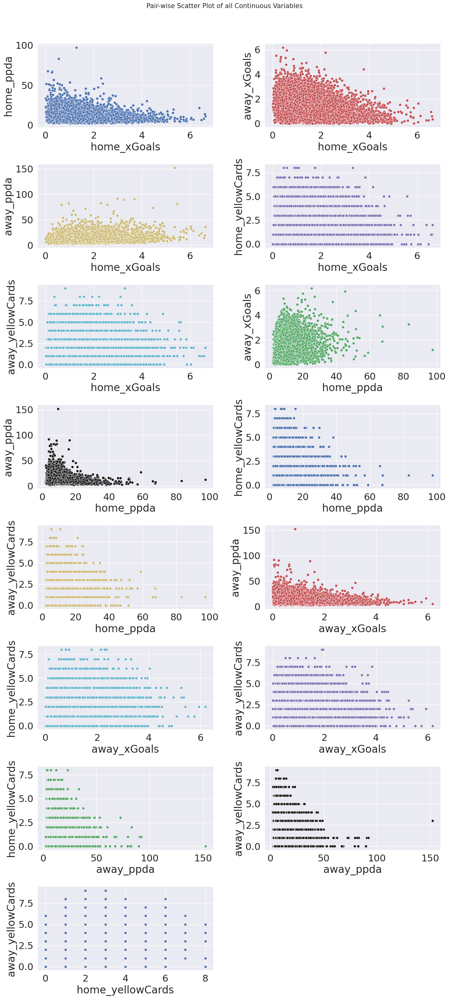

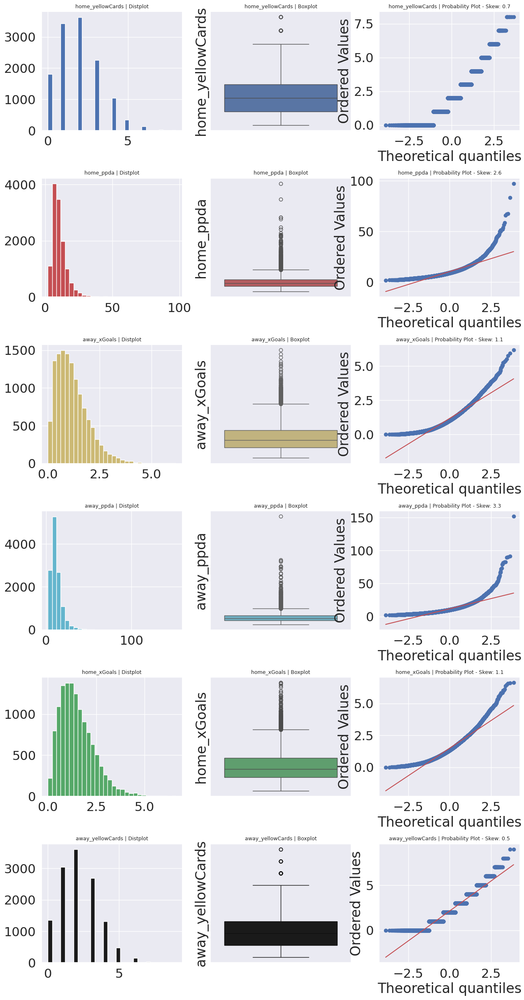

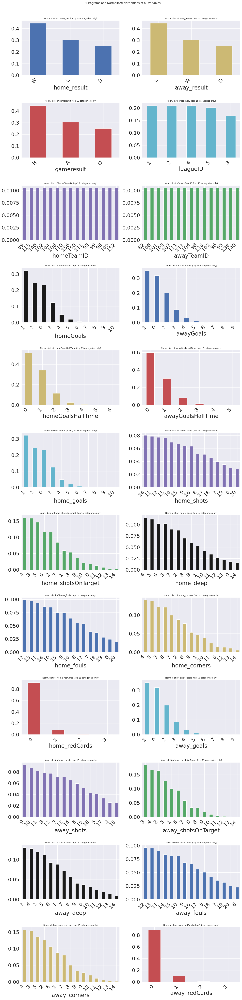

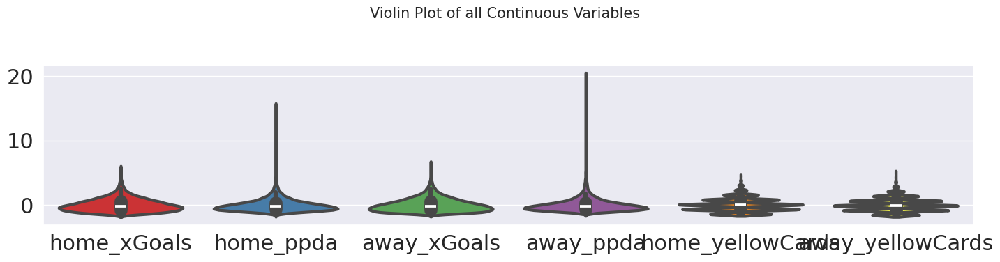

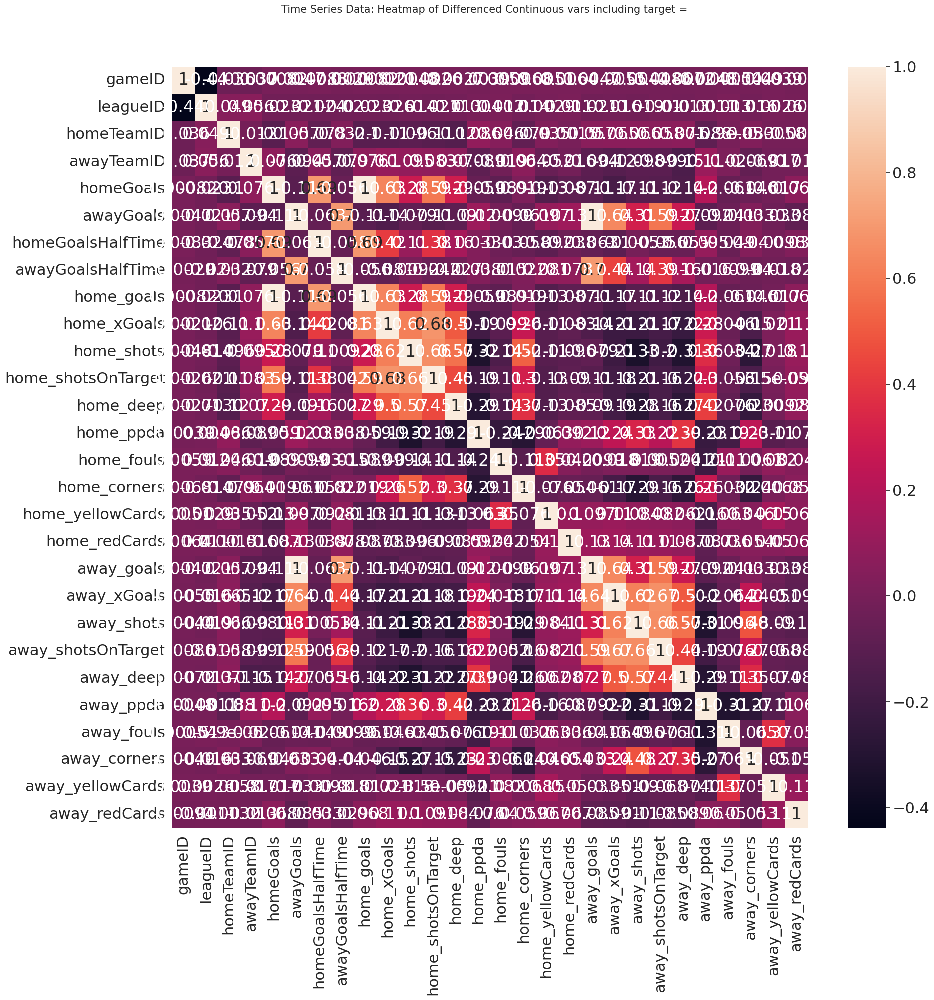

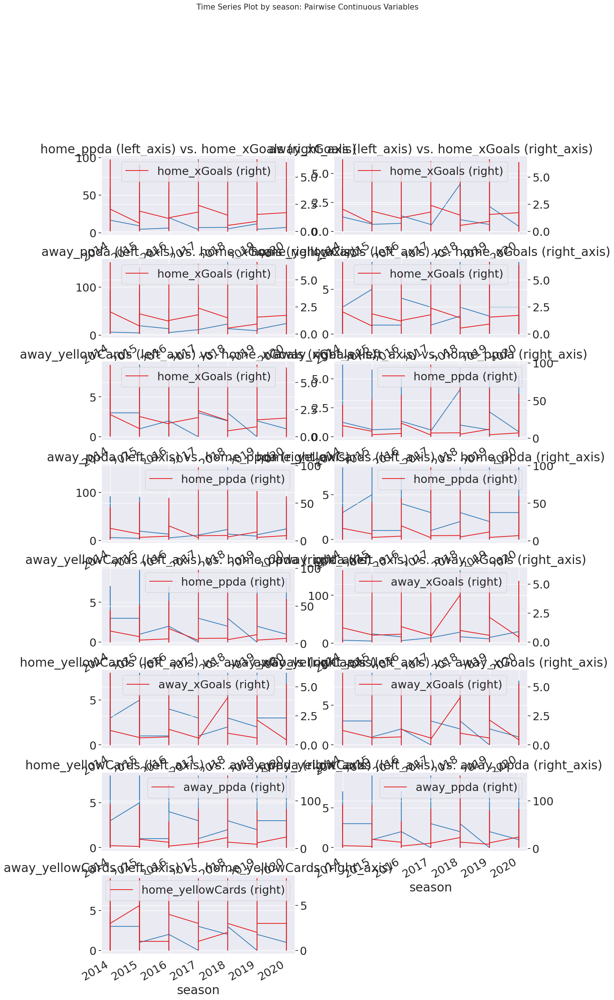

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to
[nltk_data]    |     /home/leoadmin/nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to
[nltk_data]    |     /home/leoadmin/nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to
[nltk_data]    |     /home/leoadmin/nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to
[nltk_data]    |     /home/leoadmin/nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to
[nltk_data]    |     /home/leoadmin/nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /home/leoadmin/nltk_data...
[nltk_data]    |   Package movie_reviews is a

Could not draw wordcloud plot for date
Could not draw wordcloud plot for home_date
Could not draw wordcloud plot for away_date
All Plots done
Time to run AutoViz = 62 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


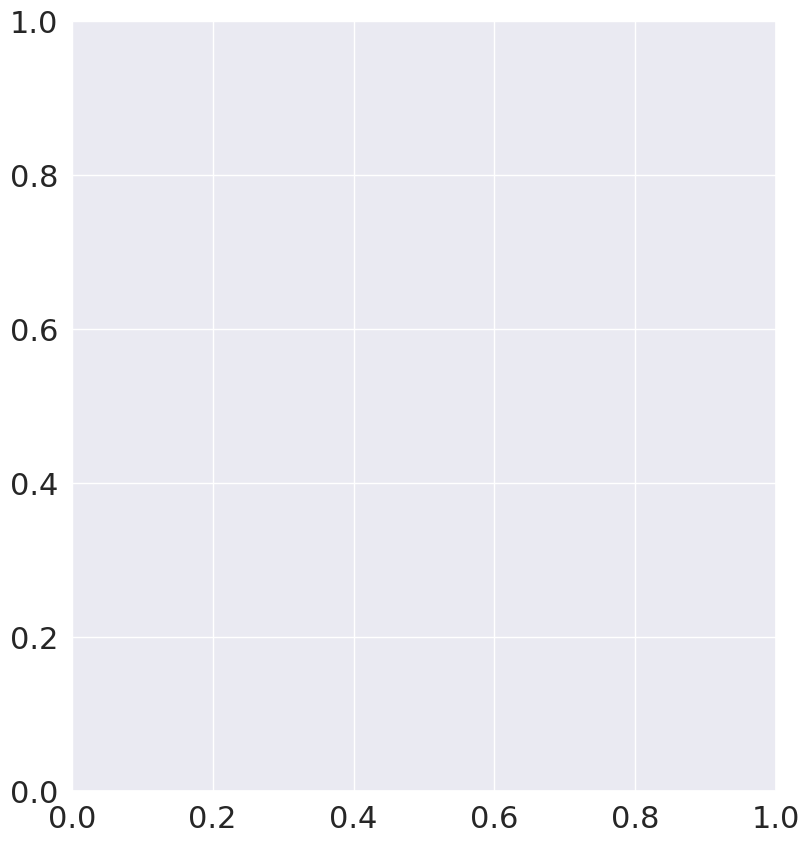

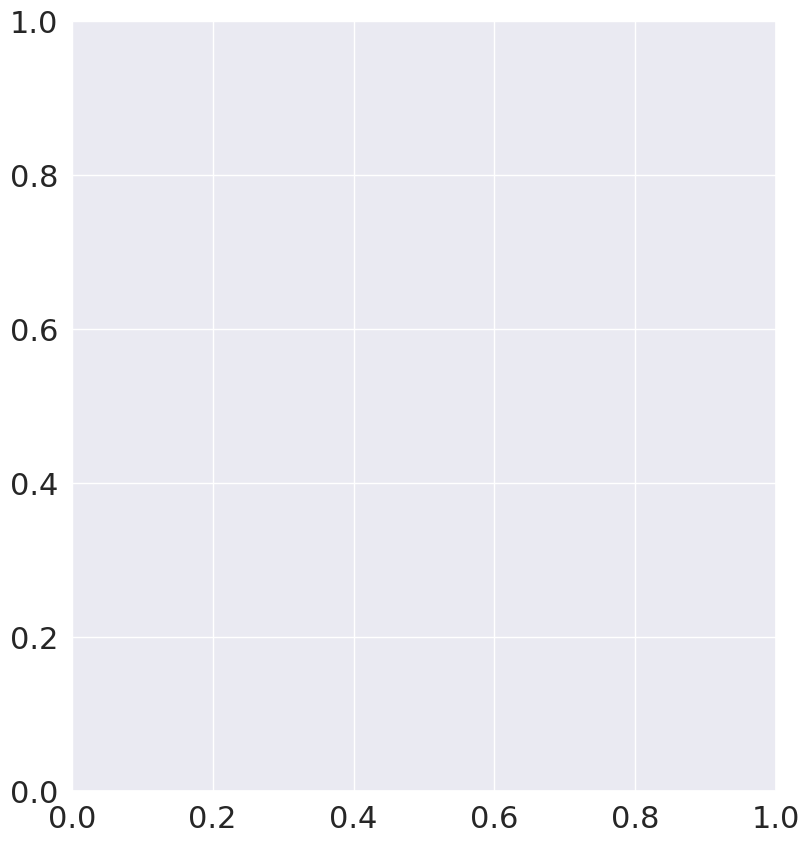

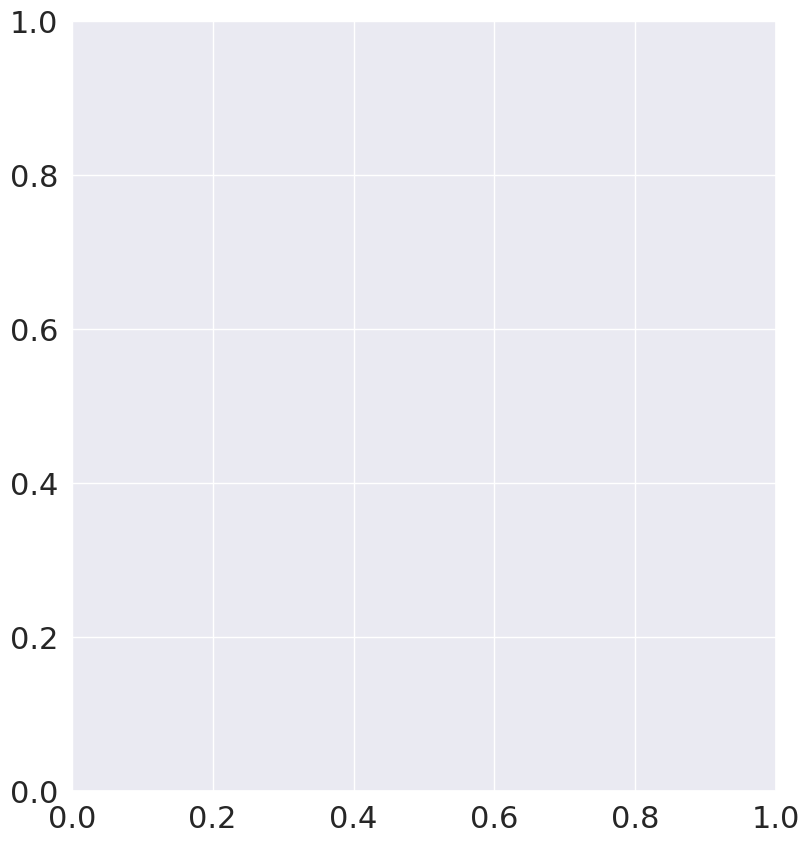

In [122]:
AV = AutoViz_Class()
%matplotlib inline
dfte = AV.AutoViz('mydata.csv', sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
                  chart_format='svg', max_rows_analyzed=150000, max_cols_analyzed=30, save_plot_dir=None)


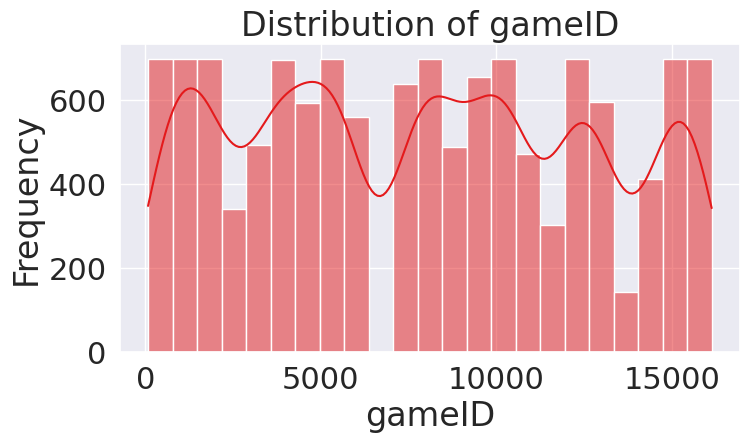

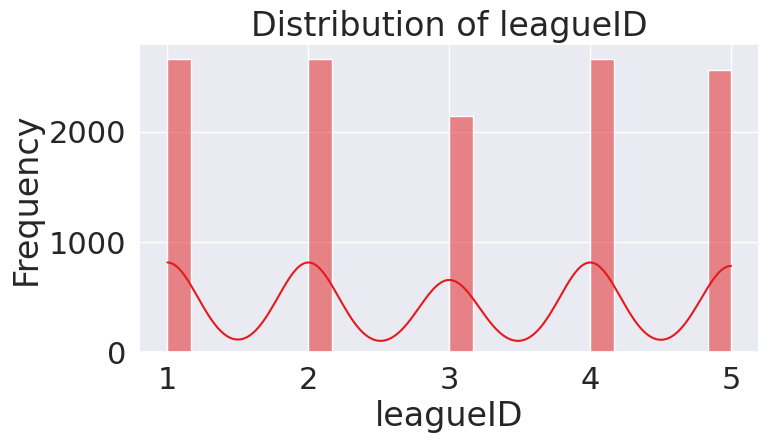

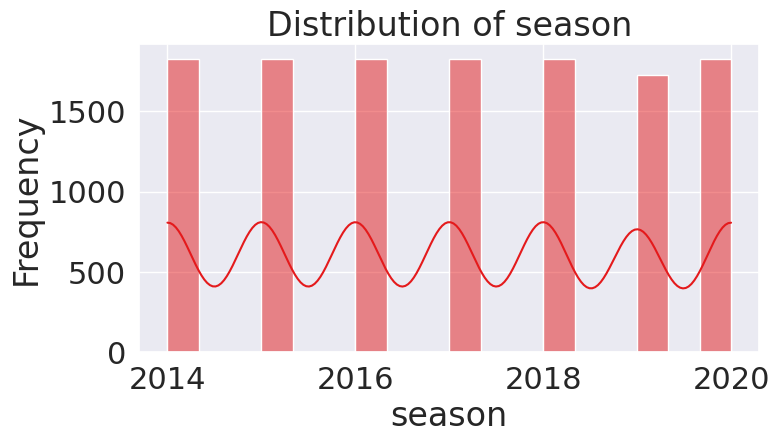

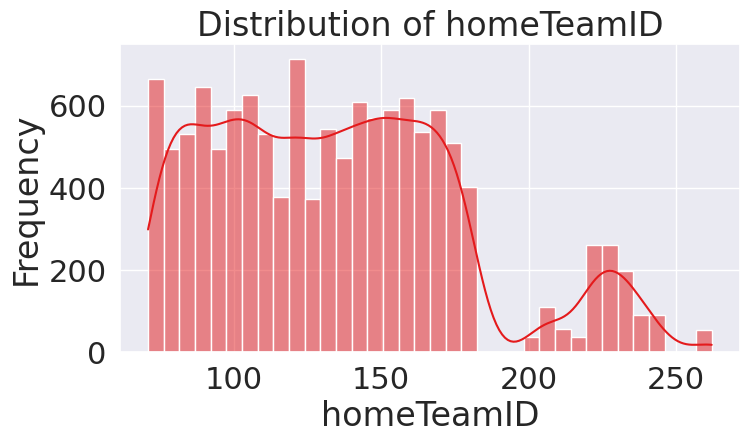

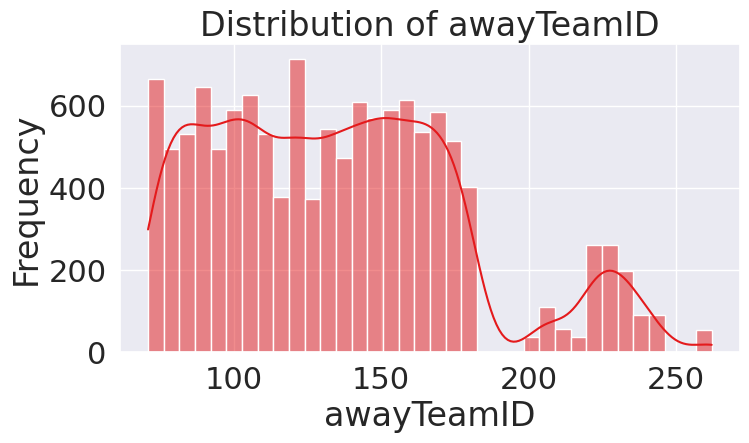

...

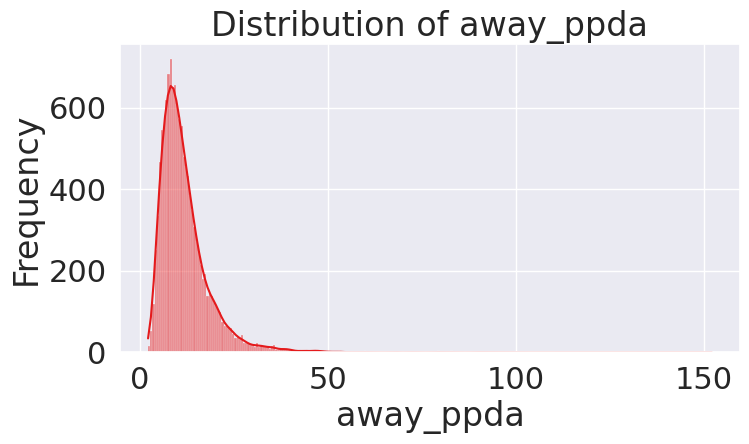

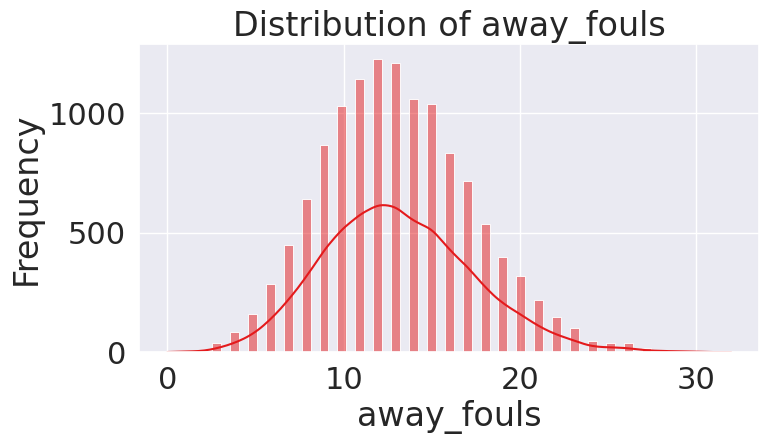

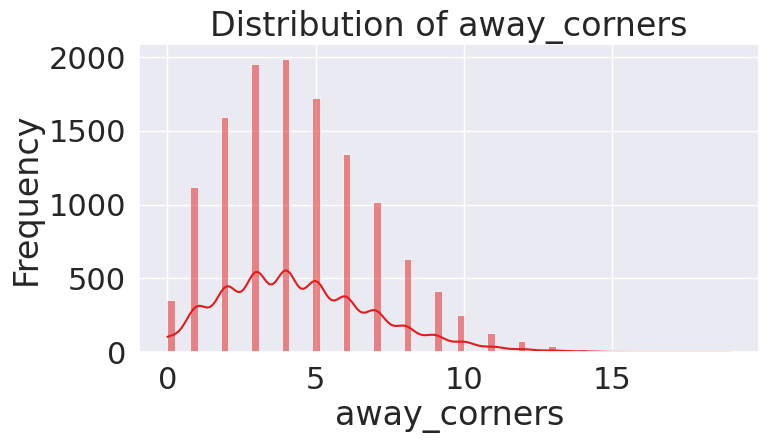

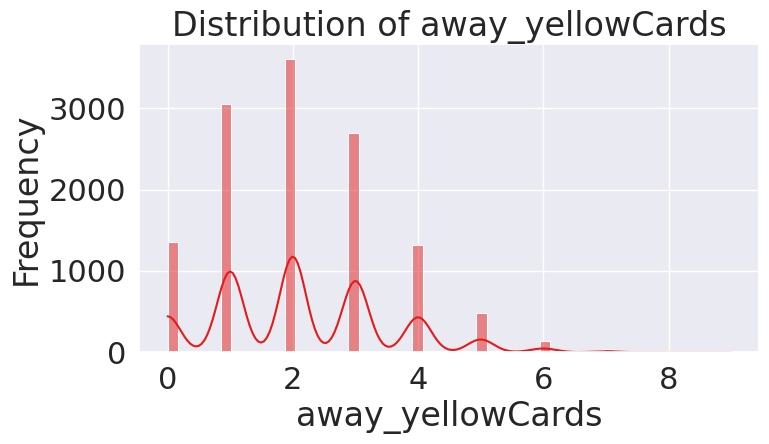

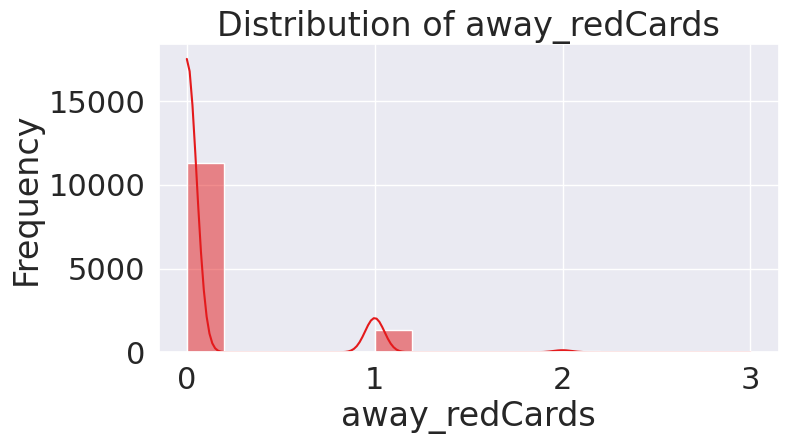

In [123]:
# Ensure inline plotting if you're in a Jupyter environment
%matplotlib inline

# Loop through all numeric columns in your DataFrame and plot distributions
for col in df.select_dtypes(include=[np.number]).columns:
    plt.figure(figsize=(8, 4))
    sns.histplot(df[col].dropna(), kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

# DateTime

In [124]:
def process_date_column(df, date_col):
    """
    Convert the date column to datetime, then split it into year, month, day, 
    and categorize the hour into time periods: 'Noon', 'After Noon', and 'Night'.
    
    Parameters:
        df (pd.DataFrame): The DataFrame containing the date column.
        date_col (str): The name of the date column.
    
    Returns:
        pd.DataFrame: The DataFrame with new columns 'year', 'month', 'day', and 'time_category'.
    """
    # Convert the date column to datetime
    df[date_col] = pd.to_datetime(df[date_col], infer_datetime_format=True)
    
    # Extract year, month, and day
    df['year'] = df[date_col].dt.year
    df['month'] = df[date_col].dt.month
    df['day'] = df[date_col].dt.day
    
    # Define a helper function to categorize the hour
    def categorize_time(dt):
        hour = dt.hour
        if 10 <= hour < 14:
            return 'Noon'
        elif 14 <= hour < 18:
            return 'After Noon'
        else:
            return 'Night'
    
    # Apply the categorization function to create the time category column
    df['time_category'] = df[date_col].apply(categorize_time)
    
    return df

# Example usage:
# Assuming your DataFrame is named df and the date column is called 'date'
df = process_date_column(df, 'date')
print(df[['date', 'year', 'month', 'day', 'time_category']].head())


          date         year  month  day time_category
0 2015-08-08 15:45:00  2015    8     8    After Noon 
1 2015-08-08 18:00:00  2015    8     8         Night 
2 2015-08-08 18:00:00  2015    8     8         Night 
3 2015-08-08 18:00:00  2015    8     8         Night 
4 2015-08-08 18:00:00  2015    8     8         Night 


In [125]:
df['time_category'].value_counts()

time_category
Night         6169
After Noon    5278
Noon          1233
Name: count, dtype: int64

# drop multiplied/not useful columns

In [126]:
df = df.drop(columns=['date',
    'home_date', 'home_location', 'home_result',
    'away_date', 'away_location', 'away_result',
    'home_season', 'away_season'
])


# Categorials

In [127]:
df['gameresult']

0        H
1        A
2        D
3        H
4        A
        ..
12675    A
12676    A
12677    H
12678    A
12679    D
Name: gameresult, Length: 12680, dtype: object

In [128]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12680 entries, 0 to 12679
Data columns (total 34 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   gameID              12680 non-null  int64  
 1   leagueID            12680 non-null  int64  
 2   season              12680 non-null  int64  
 3   homeTeamID          12680 non-null  int64  
 4   awayTeamID          12680 non-null  int64  
 5   homeGoals           12680 non-null  int64  
 6   awayGoals           12680 non-null  int64  
 7   homeGoalsHalfTime   12680 non-null  int64  
 8   awayGoalsHalfTime   12680 non-null  int64  
 9   home_goals          12680 non-null  int64  
 10  home_xGoals         12680 non-null  float64
 11  home_shots          12680 non-null  int64  
 12  home_shotsOnTarget  12680 non-null  int64  
 13  home_deep           12680 non-null  int64  
 14  home_ppda           12680 non-null  float64
 15  home_fouls          12680 non-null  int64  
 16  home

In [129]:
df['year'].value_counts()

year
2017    1877
2015    1846
2019    1823
2016    1812
2018    1808
2020    1570
2021    1093
2014     851
Name: count, dtype: int64

In [130]:
new_df=['gameresult', 'time_category']
df_cat= df[new_df]

In [131]:
df_cat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12680 entries, 0 to 12679
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   gameresult     12680 non-null  object
 1   time_category  12680 non-null  object
dtypes: object(2)
memory usage: 198.2+ KB


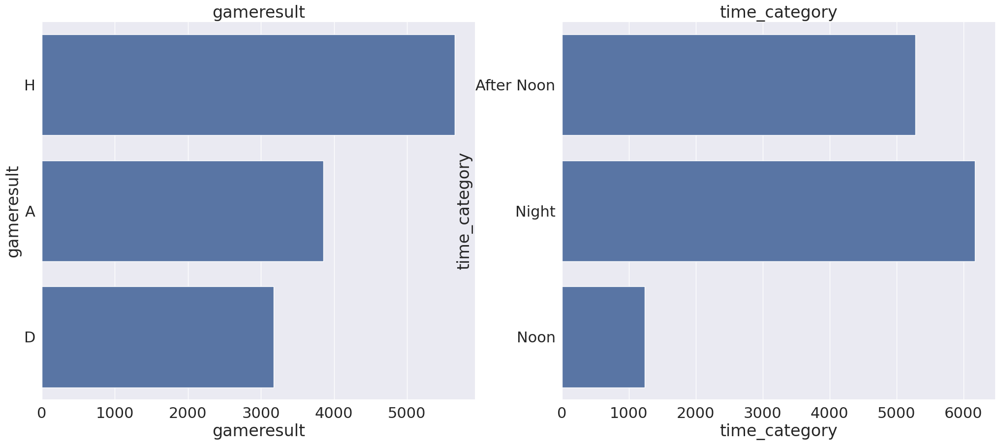

In [208]:
a=1 #number of rows 
b=2 #number of columns
c=1 #plot counter

fig=plt.figure(figsize=(25,10))
plt.subplots_adjust(hspace = 0.8)
sns.set(font_scale = 2)
for i in df_cat:
    
    plt.subplot(a,b,c)
    plt.title('{}'.format(i))
    plt.xlabel(i)
    sns.countplot(df_cat[i])
    c=c+1

plt.show()
    

# Continues (numeric)

In [133]:
#get all numeric data
#cols=df.columns
df_num=df._get_numeric_data()
df_num.shape

(12680, 32)

In [134]:
df_num.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12680 entries, 0 to 12679
Data columns (total 32 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   gameID              12680 non-null  int64  
 1   leagueID            12680 non-null  int64  
 2   season              12680 non-null  int64  
 3   homeTeamID          12680 non-null  int64  
 4   awayTeamID          12680 non-null  int64  
 5   homeGoals           12680 non-null  int64  
 6   awayGoals           12680 non-null  int64  
 7   homeGoalsHalfTime   12680 non-null  int64  
 8   awayGoalsHalfTime   12680 non-null  int64  
 9   home_goals          12680 non-null  int64  
 10  home_xGoals         12680 non-null  float64
 11  home_shots          12680 non-null  int64  
 12  home_shotsOnTarget  12680 non-null  int64  
 13  home_deep           12680 non-null  int64  
 14  home_ppda           12680 non-null  float64
 15  home_fouls          12680 non-null  int64  
 16  home

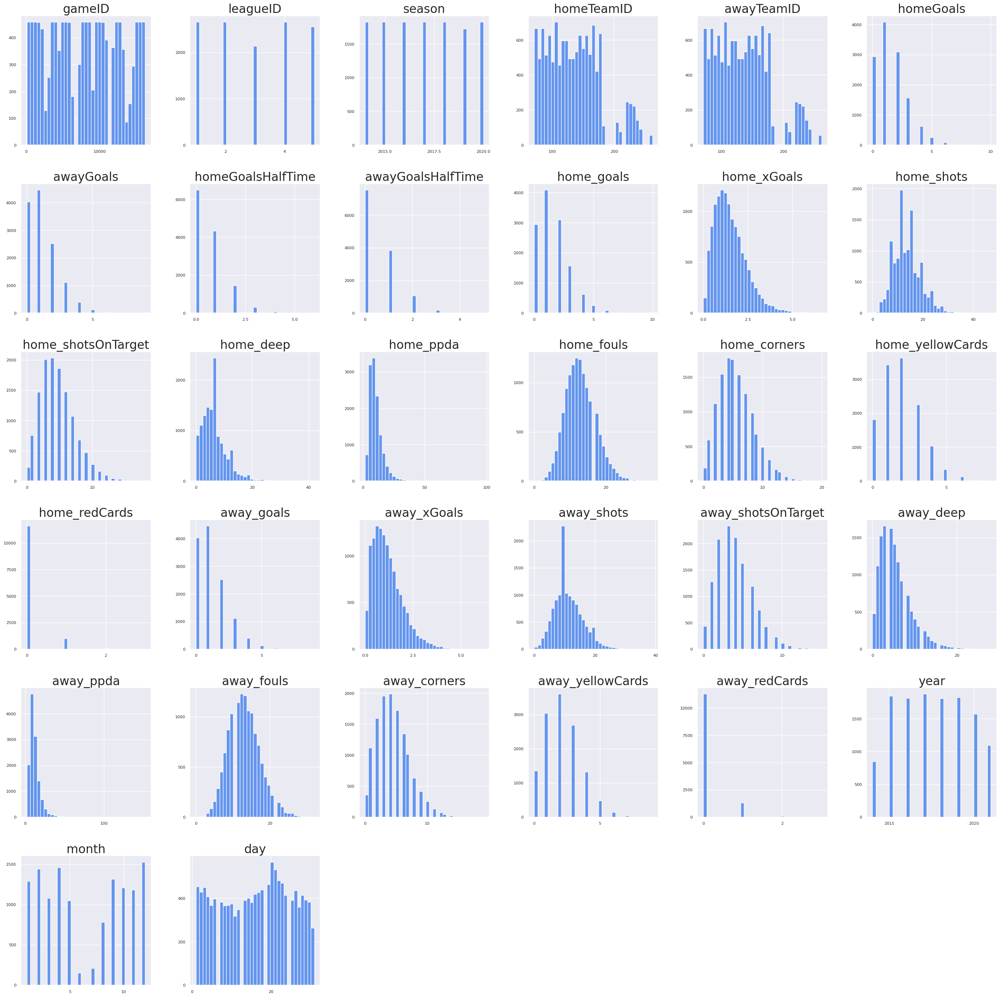

In [135]:
df_num.hist(figsize=(35, 35), bins=35, xlabelsize=8, ylabelsize=8, color = "cornflowerblue");

# Skewness

In [136]:
def highlight(cell_value):
    highlight = 'background-color: mediumspringgreen;'
    default = ''
    negative = 'background-color: hotpink;'
    if cell_value > 1:
        return highlight
    elif cell_value < -1:
        return negative
    #else
       # return default  
pd.DataFrame(df_num.skew(),columns=['skewness']).sort_values(by='skewness', ascending=False).style.applymap(highlight)

,skewness
home_redCards,3.412354
away_ppda,3.277596
away_redCards,2.880568
home_ppda,2.602424
awayGoalsHalfTime,1.412630
home_deep,1.358435
homeGoalsHalfTime,1.294446
away_deep,1.282733
away_xGoals,1.126784
awayGoals,1.122382


# Y - Target Value

<Axes: xlabel='gameresult', ylabel='count'>

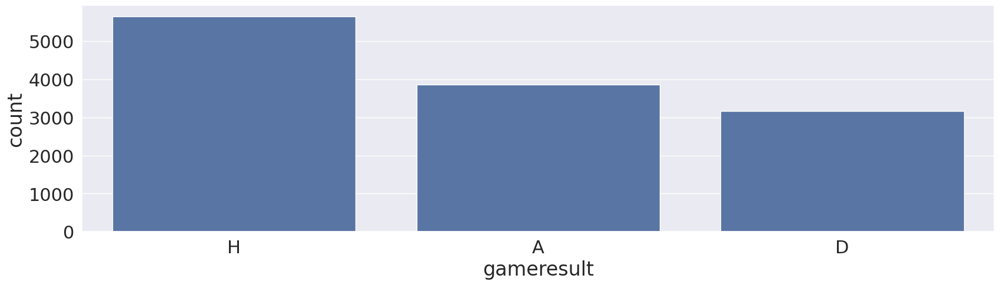

In [137]:
fig, ax=plt.subplots(figsize=(20, 5))
sns.countplot(x=df['gameresult'].dropna(),data=df)

In [138]:
df['gameresult'].value_counts()

gameresult
H    5654
A    3854
D    3172
Name: count, dtype: int64

### Correlation

In [139]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12680 entries, 0 to 12679
Data columns (total 34 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   gameID              12680 non-null  int64  
 1   leagueID            12680 non-null  int64  
 2   season              12680 non-null  int64  
 3   homeTeamID          12680 non-null  int64  
 4   awayTeamID          12680 non-null  int64  
 5   homeGoals           12680 non-null  int64  
 6   awayGoals           12680 non-null  int64  
 7   homeGoalsHalfTime   12680 non-null  int64  
 8   awayGoalsHalfTime   12680 non-null  int64  
 9   home_goals          12680 non-null  int64  
 10  home_xGoals         12680 non-null  float64
 11  home_shots          12680 non-null  int64  
 12  home_shotsOnTarget  12680 non-null  int64  
 13  home_deep           12680 non-null  int64  
 14  home_ppda           12680 non-null  float64
 15  home_fouls          12680 non-null  int64  
 16  home

# Label Encoding

In [140]:
from sklearn.preprocessing import LabelEncoder

# Identify object (categorical) columns
categorical_cols = df.select_dtypes(include=['object', 'category']).columns

# Initialize LabelEncoder
le = LabelEncoder()

# Apply Label Encoding to each categorical column
for col in categorical_cols:
    df[col] = le.fit_transform(df[col])

In [141]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12680 entries, 0 to 12679
Data columns (total 34 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   gameID              12680 non-null  int64  
 1   leagueID            12680 non-null  int64  
 2   season              12680 non-null  int64  
 3   homeTeamID          12680 non-null  int64  
 4   awayTeamID          12680 non-null  int64  
 5   homeGoals           12680 non-null  int64  
 6   awayGoals           12680 non-null  int64  
 7   homeGoalsHalfTime   12680 non-null  int64  
 8   awayGoalsHalfTime   12680 non-null  int64  
 9   home_goals          12680 non-null  int64  
 10  home_xGoals         12680 non-null  float64
 11  home_shots          12680 non-null  int64  
 12  home_shotsOnTarget  12680 non-null  int64  
 13  home_deep           12680 non-null  int64  
 14  home_ppda           12680 non-null  float64
 15  home_fouls          12680 non-null  int64  
 16  home

In [142]:
display(df.corr(method='spearman'))

,gameID,leagueID,season,homeTeamID,awayTeamID,homeGoals,awayGoals,homeGoalsHalfTime,awayGoalsHalfTime,home_goals,home_xGoals,home_shots,home_shotsOnTarget,home_deep,home_ppda,home_fouls,home_corners,home_yellowCards,home_redCards,away_goals,away_xGoals,away_shots,away_shotsOnTarget,away_deep,away_ppda,away_fouls,away_corners,away_yellowCards,away_redCards,gameresult,year,month,day,time_category
gameID,1.000000,0.099159,0.877737,0.209625,0.209771,-0.008982,0.044875,-0.010051,0.036556,-0.008982,0.012455,-0.042731,-0.025144,0.002686,0.167540,-0.040685,-0.055079,0.011071,-0.017769,0.044875,0.077129,0.005903,0.010477,0.046373,0.142706,-0.084178,-0.000911,-0.028587,-0.028550,-0.037076,0.870444,-0.014631,-0.011774,-0.048960
leagueID,0.099159,1.000000,-0.011189,0.792713,0.792729,-0.011436,-0.033221,-0.012514,-0.024377,-0.011436,-0.025624,-0.065502,-0.023131,-0.131457,-0.076538,0.162998,-0.052350,0.058865,0.050574,-0.033221,-0.059968,-0.079133,-0.040358,-0.155058,-0.046172,0.156793,-0.075183,0.071430,0.047800,0.014447,-0.010301,-0.029395,-0.004534,0.156978
season,0.877737,-0.011189,1.000000,0.105348,0.105574,-0.003730,0.050618,-0.014749,0.035981,-0.003730,0.015879,-0.045656,-0.023462,0.021069,0.189531,-0.077293,-0.057595,0.002181,-0.027561,0.050618,0.089045,0.011487,0.018133,0.070025,0.157211,-0.126810,0.006746,-0.038300,-0.032324,-0.034049,0.972616,0.012522,-0.006014,-0.012585
homeTeamID,0.209625,0.792713,0.105348,1.000000,0.639405,-0.069399,0.012202,-0.057732,0.005813,-0.069399,-0.075861,-0.108939,-0.081902,-0.173588,-0.001118,0.136529,-0.085996,0.068647,0.038085,0.012202,0.002803,-0.024689,0.010442,-0.074565,-0.064978,0.099293,-0.041230,0.038146,0.028949,-0.051995,0.103710,-0.021200,-0.002391,0.120353
awayTeamID,0.209771,0.792729,0.105574,0.639405,1.000000,0.033380,-0.072173,0.017850,-0.054686,0.033380,0.040198,-0.004839,0.025673,-0.063453,-0.083552,0.100266,-0.008997,0.016880,0.028273,-0.072173,-0.099388,-0.116864,-0.086223,-0.201788,0.042069,0.118762,-0.098037,0.047083,0.031229,0.066131,0.104015,-0.019261,-0.003238,0.104184
homeGoals,-0.008982,-0.011436,-0.003730,-0.069399,0.033380,1.000000,-0.075874,0.658365,-0.031795,1.000000,0.608347,0.264244,0.566983,0.244392,-0.016869,-0.076529,0.012084,-0.110358,-0.078921,-0.075874,-0.133065,-0.075582,-0.095580,-0.098196,0.124819,-0.038290,-0.022524,-0.002762,0.078895,0.684398,0.001170,-0.003166,-0.009543,0.006508
awayGoals,0.044875,-0.033221,0.050618,0.012202,-0.072173,-0.075874,1.000000,-0.034998,0.665542,-0.075874,-0.124532,-0.062635,-0.093423,-0.064400,0.081781,0.007621,-0.042092,0.094092,0.119724,1.000000,0.606813,0.301792,0.563273,0.250748,-0.053056,-0.020160,0.036902,-0.015331,-0.065490,-0.642559,0.049534,0.008421,-0.008641,-0.002074
homeGoalsHalfTime,-0.010051,-0.012514,-0.014749,-0.057732,0.017850,0.658365,-0.034998,1.000000,-0.034418,0.658365,0.384339,0.094571,0.347701,0.113474,0.078865,-0.028519,-0.061367,-0.078678,-0.034297,-0.034998,-0.060373,0.024601,-0.029802,-0.012637,0.015049,-0.031166,0.055099,0.000536,0.036997,0.435125,-0.011418,0.000738,-0.010568,-0.000389
awayGoalsHalfTime,0.036556,-0.024377,0.035981,0.005813,-0.054686,-0.031795,0.665542,-0.034418,1.000000,-0.031795,-0.067653,0.020847,-0.028309,-0.000579,-0.009549,-0.004332,0.034687,0.074368,0.076753,0.665542,0.402162,0.133999,0.362111,0.131121,0.030521,-0.003575,-0.037495,-0.007396,-0.019710,-0.413768,0.035612,0.004352,-0.019144,-0.005596
home_goals,-0.008982,-0.011436,-0.003730,-0.069399,0.033380,1.000000,-0.075874,0.658365,-0.031795,1.000000,0.608347,0.264244,0.566983,0.244392,-0.016869,-0.076529,0.012084,-0.110358,-0.078921,-0.075874,-0.133065,-0.075582,-0.095580,-0.098196,0.124819,-0.038290,-0.022524,-0.002762,0.078895,0.684398,0.001170,-0.003166,-0.009543,0.006508


<Axes: >

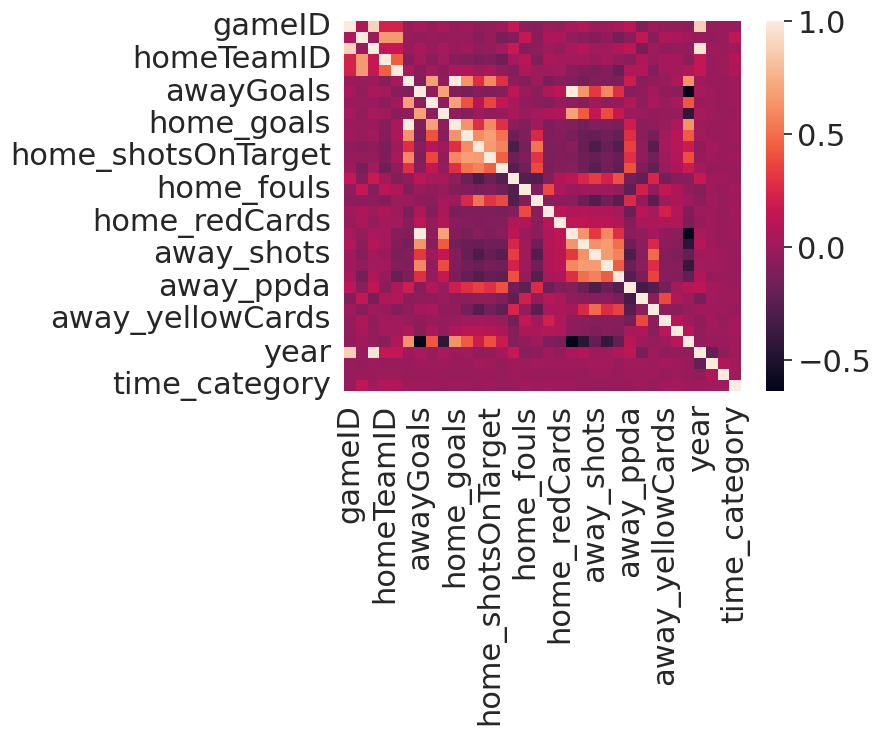

In [143]:
sns.heatmap(df.corr())

In [82]:
df['home_season'].value_counts()

home_season
2015    1826
2014    1826
2017    1826
2018    1826
2020    1826
2016    1825
2019    1725
Name: count, dtype: int64

# T-Test

In [144]:
import scipy.stats as stats
import seaborn as sns

In [148]:
df[['gameresult','home_goals','away_goals']]

,gameresult,home_goals,away_goals
0,2,1,0
1,0,0,1
2,1,2,2
3,2,4,2
4,0,1,3
...,...,...,...
12675,0,1,2
12676,0,1,2
12677,2,2,0
12678,0,0,1


In [149]:
from scipy.stats import ttest_ind

# Create groups based on gameresult:
# Group 1: Home Wins (assuming gameresult == 2 indicates a home win)
home_wins = df[df['gameresult'] == 2]['home_xGoals']

# Group 2: Not Home Wins (draws and away wins)
non_home_wins = df[df['gameresult'] != 2]['home_xGoals']

# Perform the t-test (using Welch's t-test by setting equal_var=False)
t_stat, p_val = ttest_ind(home_wins, non_home_wins, equal_var=False)

print(f"T-statistic: {t_stat:.4f}, p-value: {p_val:.4f}")


T-statistic: 51.8705, p-value: 0.0000


You can confidently reject the null hypothesis that there is no difference in home_xGoals between home wins and non-home wins. 
In practical terms, this means that the home team’s expected goals (home_xGoals) are significantly higher (or lower, depending on the direction of the difference) when they win compared to when they don’t win, and this difference is not due to random chance.
If you’re using this variable for predictive modeling or further analysis, it appears to be a very strong indicator of match outcome in your dataset. 

In [153]:
from scipy.stats import f_oneway

# Assuming gameresult codes: 2 for home win, 1 for draw, 0 for away win (or adjust as needed)
group_home_win = df[df['gameresult'] == 2]['home_xGoals']
group_draw = df[df['gameresult'] == 1]['home_xGoals']
group_away_win = df[df['gameresult'] == 0]['home_xGoals']

f_stat, p_val = f_oneway(group_home_win, group_draw, group_away_win)
print(f"ANOVA F-statistic: {f_stat:.4f}, p-value: {p_val:.4f}")


ANOVA F-statistic: 1547.4971, p-value: 0.0000


This indicates that the means of the home_xGoals variable differ significantly across all three groups (home win, draw, away win). In other words, at least one group’s mean is different from the others. This justifies that home_xGoals is an important metric in differentiating match outcomes.

In [154]:
from scipy.stats import ttest_rel

# Create a new series with the difference between home and away expected goals
diff_xGoals = df['home_xGoals'] - df['away_xGoals']
# If you have a hypothesis regarding this difference, you could perform a paired t-test.
# For example, testing whether the mean difference is significantly different from 0:
t_stat, p_val = ttest_rel(df['home_xGoals'], df['away_xGoals'])
print(f"Paired t-test: t-statistic = {t_stat:.4f}, p-value = {p_val:.4f}")


Paired t-test: t-statistic = 28.1871, p-value = 0.0000


The paired t-test shows a highly significant difference between home_xGoals and away_xGoals for each game. This suggests that the disparity between home and away expected goals is very informative about the match outcome.

In [155]:
# List of features to test
features = [
    'home_shots', 'away_shots',
    'home_deep', 'away_deep',
    'home_ppda', 'away_ppda',
    'home_fouls', 'away_fouls',
    'home_corners', 'away_corners',
    'home_yellowCards', 'away_yellowCards',
    'home_redCards', 'away_redCards',
    'homeGoalsHalfTime', 'awayGoalsHalfTime'
]

# Loop over each feature and perform one-way ANOVA based on gameresult groups
for feat in features:
    # Create a list of series, one for each group defined by gameresult
    groups = [group[feat].dropna() for _, group in df.groupby('gameresult')]
    
    # Run ANOVA: f_oneway takes each group as a separate argument
    f_stat, p_val = f_oneway(*groups)
    print(f"ANOVA for {feat}: F-statistic = {f_stat:.4f}, p-value = {p_val:.4f}")


ANOVA for home_shots: F-statistic = 220.7895, p-value = 0.0000
ANOVA for away_shots: F-statistic = 331.2351, p-value = 0.0000
ANOVA for home_deep: F-statistic = 224.1493, p-value = 0.0000
ANOVA for away_deep: F-statistic = 333.4027, p-value = 0.0000
ANOVA for home_ppda: F-statistic = 55.9803, p-value = 0.0000
ANOVA for away_ppda: F-statistic = 81.4031, p-value = 0.0000
ANOVA for home_fouls: F-statistic = 22.5709, p-value = 0.0000
ANOVA for away_fouls: F-statistic = 29.2506, p-value = 0.0000
ANOVA for home_corners: F-statistic = 11.3146, p-value = 0.0000
ANOVA for away_corners: F-statistic = 4.2018, p-value = 0.0150
ANOVA for home_yellowCards: F-statistic = 84.8338, p-value = 0.0000
ANOVA for away_yellowCards: F-statistic = 16.2915, p-value = 0.0000
ANOVA for home_redCards: F-statistic = 108.9195, p-value = 0.0000
ANOVA for away_redCards: F-statistic = 74.0203, p-value = 0.0000
ANOVA for homeGoalsHalfTime: F-statistic = 1462.3766, p-value = 0.0000
ANOVA for awayGoalsHalfTime: F-statisti

These ANOVA results tell you that for every feature you tested, the mean value differs significantly across the match outcome groups (gameresult), meaning that the variation between groups is far greater than the variation within each group. In other words:

High F-statistics & Near-Zero P-values:
Almost every feature (e.g., home_shots, away_shots, homeGoalsHalfTime, etc.) shows a very high F-statistic and a p-value effectively equal to 0. This indicates that the probability of observing such differences by chance is extremely low. For instance, homeGoalsHalfTime and awayGoalsHalfTime have F-statistics over 1400, suggesting that these variables differ drastically across the different match outcomes.

Away_corners Exception:
Although the F-statistic for away_corners is lower (4.2018), its p-value is still below a typical significance threshold (p = 0.0150), meaning that even this feature shows statistically significant differences between groups.

In [170]:
from matplotlib.backends.backend_pdf import PdfPages
import textwrap

# Loop over each feature
pdf = PdfPages('analysis_results_table.pdf')

for feat in features:
    # 1) Perform Tukey’s HSD
    mask = df[feat].notna()
    tukey_result = pairwise_tukeyhsd(
        endog=df.loc[mask, feat],
        groups=df.loc[mask, 'gameresult'],
        alpha=0.05
    )

    # 2) Boxplot Page
    fig_box, ax_box = plt.subplots(figsize=(8, 6))
    sns.boxplot(x='gameresult', y=feat, data=df, ax=ax_box)
    ax_box.set_title(f"Boxplot of {feat} by gameresult")
    ax_box.set_xlabel("gameresult")
    ax_box.set_ylabel(feat)
    plt.tight_layout()
    pdf.savefig(fig_box)
    plt.close(fig_box)

    # 3) Levene's Test
    groups = [group[feat].dropna() for _, group in df.groupby('gameresult')]
    stat, p_val = levene(*groups)
    levene_text = f"Levene's test for {feat}: Statistic={stat:.4f}, p-value={p_val:.4f}"

    # 4) Tukey Table Page (without adding Levene to the table)
    table_data = tukey_result.summary().data  # includes title, headers, etc.

    # Create a figure for the Tukey table
    # Increase bottom margin so there's space for Levene text
    fig_table, ax_table = plt.subplots(figsize=(12, 6))

    ax_table.axis('off')
    ax_table.set_title(f"Tukey's HSD for {feat}", pad=20)
    # Place the Tukey table near the top
    table = ax_table.table(
    cellText=table_data,
    loc='upper center',
    )
    table.auto_set_font_size(False)
    table.set_fontsize(8)
    table.auto_set_column_width(col=list(range(len(table_data[0]))))
    ax_table.set_title(f"Tukey's HSD for {feat}", pad=20)

    # Add Levene's test text below the table
    # Adjust 'y' coordinate or 'bottom' margin if text is clipped
    ax_table.text(
        0.0, 0.03,  # x=0.0 => left margin, y=0.03 => near the bottom
        levene_text,
        transform=ax_table.transAxes,
        fontsize=10
    )

    pdf.savefig(fig_table, bbox_inches='tight')
    plt.close(fig_table)

pdf.close()

In [177]:
from IPython.display import IFrame

# Replace "analysis_results_table.pdf" with the actual path to your PDF
IFrame("analysis_results_table.pdf", width=1600, height=600)

Overall Observations
Most Features Show Statistically Significant Differences
For nearly all features, Tukey’s HSD indicates at least some pairwise group differences with p < 0.05, meaning the mean values of these features differ across the three gameresult categories.

Variance Differences in Many Cases
Levene’s test often returns a very small p-value (e.g., 0.0000), suggesting the assumption of equal variances (homoscedasticity) does not hold for a number of these features. A few features (like home_fouls, away_fouls) do not exhibit significant variance differences.

Some Features Differ Between All Pairs; Others Only Some

All pairs differ: home_shots, away_shots, home_deep, away_deep, home_redCards, away_redCards, homeGoalsHalfTime, and awayGoalsHalfTime each show significant mean differences among all three pairs (0 vs. 1, 0 vs. 2, and 1 vs. 2).
Partial differences: Some features only differ for certain group pairs. For example,
home_ppda: differs between (0 vs. 1) and (0 vs. 2), but not (1 vs. 2).
home_fouls: differs between (0 vs. 2) and (1 vs. 2), but not (0 vs. 1).
away_fouls: differs between (0 vs. 1) and (1 vs. 2), but not (0 vs. 2).
Interpreting “Reject=True”
Whenever Tukey’s HSD shows “reject = True,” it means there is a statistically significant difference in the mean of that feature between those two gameresult groups at the chosen alpha level (0.05 by default).

High-Level Takeaways
Shots (home_shots, away_shots) and Deep (home_deep, away_deep) are strongly different among all outcomes, indicating that teams’ shot counts and attacking penetration vary considerably depending on the result.
Half-Time Goals (homeGoalsHalfTime, awayGoalsHalfTime) also differ significantly for all pairs, suggesting that scoring patterns before halftime strongly correlate with the final match outcome.
Red Cards (home_redCards, away_redCards) differ across all three groups, but the differences are quite small in absolute terms. Still, they are statistically meaningful.
PPDA (home_ppda, away_ppda) shows partial differences. For instance, away_ppda is significantly different between (0 vs. 2) and (1 vs. 2) but not between (0 vs. 1).
Fouls and Corners often differ for two of the pairs but not all three, indicating these stats may be somewhat less discriminative than others like shots or goals.
Variance Differences: In many cases (e.g., home_ppda, away_ppda, homeShots), Levene’s test reveals that the spread of values is not the same across all outcome groups, meaning you should be cautious if you assume homoscedasticity for further parametric tests.
Practical Implications
Predictive Modeling:
Features such as shots, xGoals (if available), deep completions, and first-half goals appear highly indicative of final match outcomes. They may serve as strong predictors in classification models.

Further Analysis:

Pairwise differences from Tukey’s HSD highlight where exactly the mean of a feature is higher or lower. For example, if “group2” (possibly home wins) consistently has higher home_shots than “group0” or “group1,” that indicates the home team’s shot volume is a good indicator of a home win.
Variance differences from Levene’s test mean you should check assumptions (e.g., for ANOVA or regression). If variances are unequal, you might use Welch’s ANOVA or heteroscedastic-robust methods.
Game Strategy Insights:

High shot counts and high attacking penetration (deep completions) are strongly tied to winning or losing.
Early goals (reflected in half-time goals) also have a major effect on eventual outcomes.
Discipline stats (cards, fouls) do show some differences but are generally not as consistently discriminative across all pairs as shots and goals are.
Conclusion
The PDF results confirm that most match statistics differ significantly across the three outcome categories. While some features (e.g., home_ppda, home_fouls) only differ for specific pairwise comparisons, many others (shots, deep completions, half-time goals) show universal differences among all three groups. Furthermore, unequal variances are common, so any parametric modeling approach should account for heteroscedasticity or use robust methods.

Overall, these findings suggest that the identified features—particularly shots, half-time goals, and deep completions—are strongly associated with match outcomes and could be valuable for predictive or explanatory models of football results.

# Chi-Square

In [184]:
from scipy.stats import chi2_contingency

# Suppose your DataFrame is named df and contains the columns:
#   - 'gameresult' (categorical codes like 0, 1, 2)
#   - 'time_category' (e.g., 'Noon', 'After Noon', 'Night')
#   - 'leagueID' (categorical league identifiers)

# List of categorical pairs to test
cat_pairs = [
    ("gameresult", "time_category"),
    ("gameresult", "leagueID"),
    ("leagueID", "time_category")
]

for col1, col2 in cat_pairs:
    # Create a contingency table
    contingency_table = pd.crosstab(df[col1], df[col2])
    
    # Run the chi-square test of independence
    chi2, p_val, dof, expected = chi2_contingency(contingency_table)
    
    print(f"=== Chi-square test: {col1} vs. {col2} ===")
    print("Contingency Table:")
    print(contingency_table)
    print("\nExpected Frequencies:")
    print(pd.DataFrame(expected, 
                       index=contingency_table.index, 
                       columns=contingency_table.columns))
    print(f"\nChi2 Statistic: {chi2:.4f}")
    print(f"p-value: {p_val:.4f}")
    print(f"Degrees of Freedom: {dof}")
    print("-"*50, "\n")

=== Chi-square test: gameresult vs. time_category ===
Contingency Table:
time_category    0     1    2 
gameresult                    
0              1659  1799  396
1              1307  1551  314
2              2312  2819  523

Expected Frequencies:
time_category       0            1            2    
gameresult                                         
0              1604.212303  1875.025710  374.761987
1              1320.332492  1543.223028  308.444479
2              2353.455205  2750.751262  549.793533

Chi2 Statistic: 10.1604
p-value: 0.0378
Degrees of Freedom: 4
-------------------------------------------------- 

=== Chi-square test: gameresult vs. leagueID ===
Contingency Table:
leagueID      1     2    3     4     5 
gameresult                             
0            845   837  651   764   757
1            629   668  532   682   661
2           1186  1155  959  1214  1140

Expected Frequencies:
leagueID         1            2            3           4            5     
gameres

1. gameresult vs. time_category
Chi2 Statistic: 10.1604
p-value: 0.0378
Degrees of Freedom: 4
Interpretation: Because p < 0.05, you can reject the null hypothesis of independence. There is a statistically significant association between match outcome (gameresult) and the time category (e.g., Noon, After Noon, Night). While this doesn’t prove causation, it indicates that outcomes are distributed differently depending on when the match is played.
2. gameresult vs. leagueID
Chi2 Statistic: 10.2695
p-value: 0.2466
Degrees of Freedom: 8
Interpretation: Since p > 0.05, you do not reject the null hypothesis. There is no statistically significant association between match outcome and league. In other words, the distribution of (win/draw/loss) does not differ enough across leagues to be considered non-random at the 5% significance level.
3. leagueID vs. time_category
Chi2 Statistic: 1196.9879
p-value: 0.0000
Degrees of Freedom: 8
Interpretation: With p ≈ 0.0, you reject the null hypothesis of independence. There is a highly significant association between league and time category. This suggests different leagues schedule matches at different times, or at least there’s a notable imbalance in when matches occur across leagues.
Summary of Insights
Match Outcome vs. Time Category:
Outcomes vary slightly but significantly by the time of day (p ≈ 0.038). This could mean certain time slots see more home wins or fewer draws, etc.

Match Outcome vs. League:
No strong evidence that outcome distributions differ by league (p ≈ 0.247). For example, the rate of home wins, draws, and away wins is relatively consistent across leagues in this dataset.

League vs. Time Category:
Very strong evidence (p ≈ 0.0) that different leagues schedule matches at different times, or the distribution of time categories is quite distinct from league to league.

These results guide you on how scheduling and outcomes might be related and show that league scheduling times are not uniform.

# Missing

In [185]:
df.isnull().head()

,gameID,leagueID,season,homeTeamID,awayTeamID,homeGoals,awayGoals,homeGoalsHalfTime,awayGoalsHalfTime,home_goals,home_xGoals,home_shots,home_shotsOnTarget,home_deep,home_ppda,home_fouls,home_corners,home_yellowCards,home_redCards,away_goals,away_xGoals,away_shots,away_shotsOnTarget,away_deep,away_ppda,away_fouls,away_corners,away_yellowCards,away_redCards,gameresult,year,month,day,time_category
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


<Axes: >

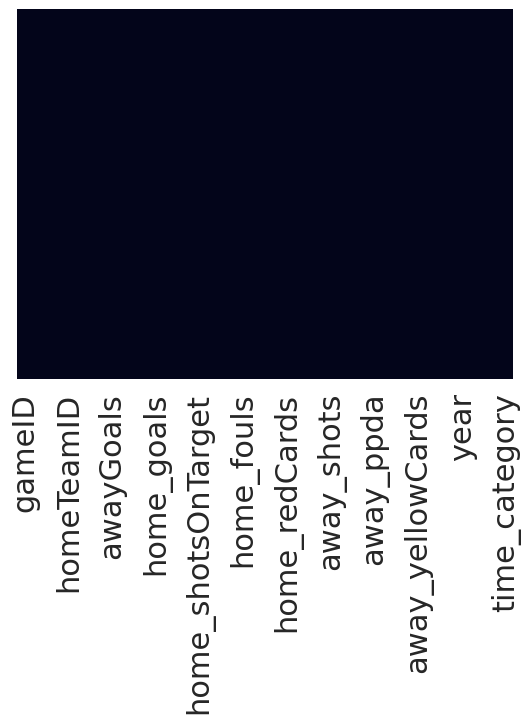

In [186]:
sns.heatmap(df.isnull(), yticklabels=False, cbar=False)

### Outliers

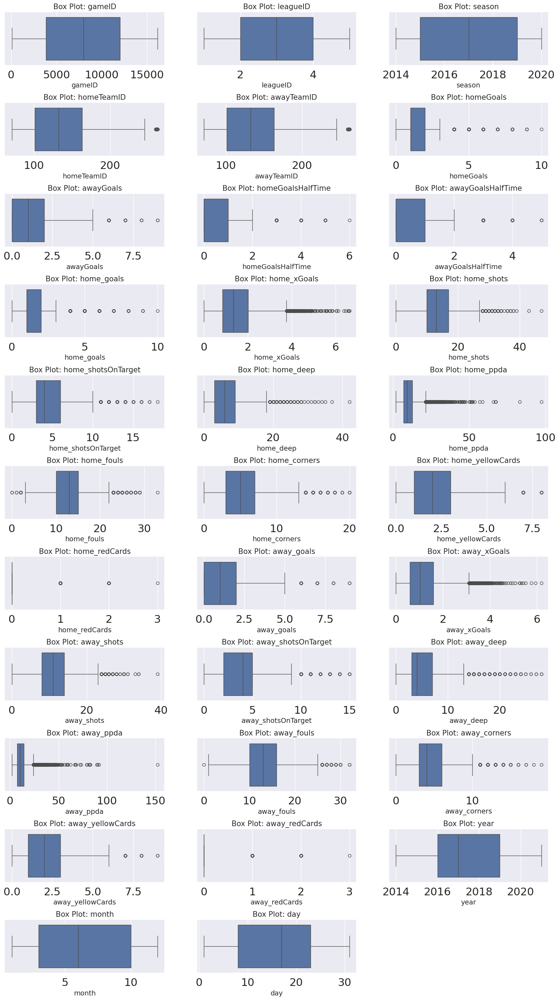

In [187]:
plt.figure(figsize=(20,200))

def outliers_boxplot(df_num):
    for i, col in enumerate(df_num.columns):
        if col != 'income':
            ax = plt.subplot(60, 3, i+1)
            sns.boxplot(data=df_num, x=col, ax=ax)
            plt.subplots_adjust(hspace = 0.7)
            plt.title('Box Plot: {}'.format(col), fontsize=15)
            plt.xlabel('{}'.format(col), fontsize=14)
        
outliers_boxplot(df_num)


### OUTLIERS DF


In [188]:
from scipy import stats
z = np.abs(stats.zscore(df_num['home_xGoals']))
print(z)

0        0.980898
1        0.702145
2        1.007042
3        1.195248
4        0.416565
           ...   
12675    0.102080
12676    0.340947
12677    0.190113
12678    0.046781
12679    1.321344
Name: home_xGoals, Length: 12680, dtype: float64


In [189]:
df_num.corr()

,gameID,leagueID,season,homeTeamID,awayTeamID,homeGoals,awayGoals,homeGoalsHalfTime,awayGoalsHalfTime,home_goals,home_xGoals,home_shots,home_shotsOnTarget,home_deep,home_ppda,home_fouls,home_corners,home_yellowCards,home_redCards,away_goals,away_xGoals,away_shots,away_shotsOnTarget,away_deep,away_ppda,away_fouls,away_corners,away_yellowCards,away_redCards,year,month,day
gameID,1.000000,0.072858,0.892661,0.226919,0.227020,-0.011281,0.041693,-0.010147,0.036880,-0.011281,0.012300,-0.046144,-0.026762,0.004827,0.154167,-0.051865,-0.056118,0.012154,-0.017018,0.041693,0.080537,0.011220,0.012793,0.051623,0.124326,-0.097707,0.005866,-0.030070,-0.031247,0.876812,-0.016287,-0.011875
leagueID,0.072858,1.000000,-0.011119,0.654947,0.655082,-0.010551,-0.033266,-0.016214,-0.028060,-0.010551,-0.020959,-0.077063,-0.027572,-0.135444,-0.089446,0.153574,-0.060272,0.062131,0.050004,-0.033266,-0.054834,-0.087946,-0.041825,-0.153626,-0.056628,0.149260,-0.078848,0.072558,0.047082,-0.010339,-0.026324,-0.003838
season,0.892661,-0.011119,1.000000,0.150428,0.150643,-0.005004,0.047093,-0.011794,0.037239,-0.005004,0.016451,-0.045796,-0.023593,0.021322,0.170753,-0.084082,-0.056416,0.005296,-0.024692,0.047093,0.089161,0.019109,0.019589,0.071294,0.132560,-0.134613,0.013587,-0.036857,-0.032423,0.970444,0.013771,-0.006088
homeTeamID,0.226919,0.654947,0.150428,1.000000,0.447147,-0.082824,0.029873,-0.067130,0.017810,-0.082824,-0.086681,-0.125642,-0.101829,-0.178874,0.031066,0.111259,-0.097566,0.065234,0.029231,0.029873,0.030597,-0.005930,0.024936,-0.033603,-0.073410,0.071804,-0.020340,0.030068,0.023702,0.146140,-0.014565,-0.002336
awayTeamID,0.227020,0.655082,0.150643,0.447147,1.000000,0.045697,-0.079964,0.023516,-0.063434,0.045697,0.062586,0.008807,0.038642,-0.037865,-0.093667,0.068203,-0.000812,0.008284,0.017174,-0.079964,-0.102430,-0.122858,-0.097219,-0.196947,0.069262,0.085614,-0.097060,0.033577,0.020449,0.146182,-0.011864,-0.001063
homeGoals,-0.011281,-0.010551,-0.005004,-0.082824,0.045697,1.000000,-0.091797,0.686711,-0.045601,1.000000,0.633394,0.280560,0.593591,0.290191,-0.050013,-0.095856,0.015645,-0.127530,-0.079678,-0.091797,-0.150787,-0.095903,-0.107634,-0.121948,0.190589,-0.064756,-0.038461,-0.018811,0.073835,-0.000076,-0.009283,-0.008087
awayGoals,0.041693,-0.033266,0.047093,0.029873,-0.079964,-0.091797,1.000000,-0.049180,0.693219,-0.091797,-0.133299,-0.078399,-0.106081,-0.083998,0.128793,-0.007724,-0.054669,0.075062,0.125208,1.000000,0.637575,0.317296,0.592635,0.279250,-0.076767,-0.042297,0.033683,-0.037359,-0.071896,0.046762,0.004524,-0.005986
homeGoalsHalfTime,-0.010147,-0.016214,-0.011794,-0.067130,0.023516,0.686711,-0.049180,1.000000,-0.045991,0.686711,0.411409,0.107984,0.373370,0.149202,0.037027,-0.041205,-0.060808,-0.091821,-0.032265,-0.049180,-0.078845,0.009982,-0.043097,-0.034707,0.085716,-0.047548,0.045411,-0.012569,0.035476,-0.008451,-0.002969,-0.008128
awayGoalsHalfTime,0.036880,-0.028060,0.037239,0.017810,-0.063434,-0.045601,0.693219,-0.045991,1.000000,-0.045601,-0.075627,0.009638,-0.040288,-0.017102,0.043017,-0.009892,0.025100,0.064798,0.078415,0.693219,0.436978,0.149845,0.390244,0.157115,-0.005167,-0.014988,-0.035619,-0.024357,-0.023918,0.036292,0.003275,-0.016557
home_goals,-0.011281,-0.010551,-0.005004,-0.082824,0.045697,1.000000,-0.091797,0.686711,-0.045601,1.000000,0.633394,0.280560,0.593591,0.290191,-0.050013,-0.095856,0.015645,-0.127530,-0.079678,-0.091797,-0.150787,-0.095903,-0.107634,-0.121948,0.190589,-0.064756,-0.038461,-0.018811,0.073835,-0.000076,-0.009283,-0.008087


In [190]:
# Calculate correlations with outliers
correlation_with_outliers = df_num.corr()
# Calculate correlations with outliers
outlier_threshold = 2.5  # Adjust as needed



<Axes: >

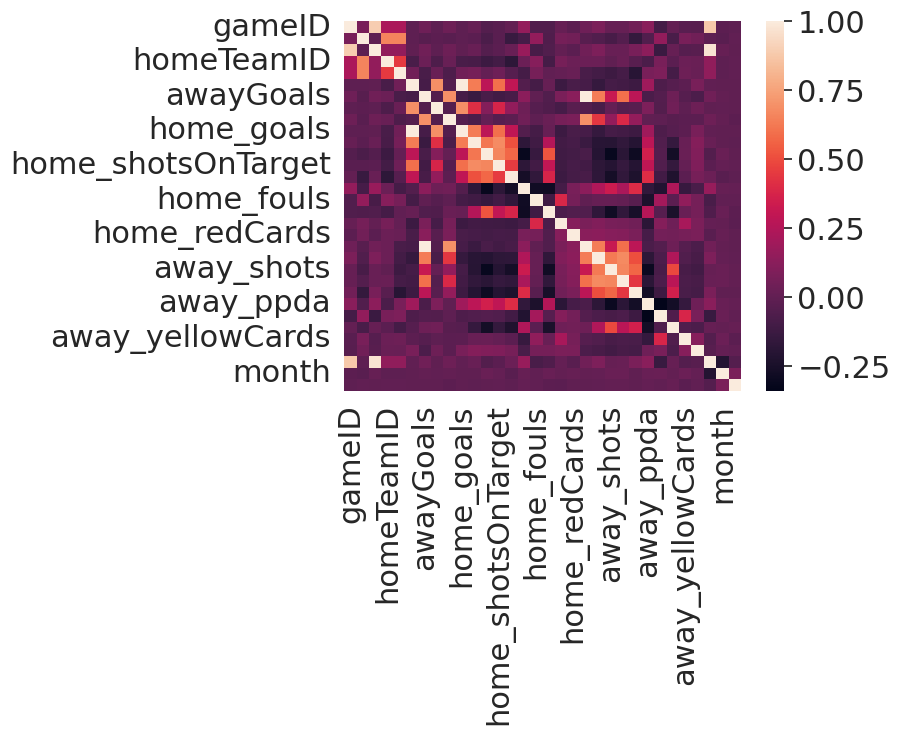

In [191]:
sns.heatmap(correlation_with_outliers)

In [192]:
df_num['home_xGoals'].value_counts()

home_xGoals
1.768180    3
1.510590    3
1.221600    2
1.129840    2
1.432290    2
           ..
2.150800    1
0.996123    1
1.363870    1
0.900312    1
0.323960    1
Name: count, Length: 12491, dtype: int64

In [193]:
df_num

,gameID,leagueID,season,homeTeamID,awayTeamID,homeGoals,awayGoals,homeGoalsHalfTime,awayGoalsHalfTime,home_goals,home_xGoals,home_shots,home_shotsOnTarget,home_deep,home_ppda,home_fouls,home_corners,home_yellowCards,home_redCards,away_goals,away_xGoals,away_shots,away_shotsOnTarget,away_deep,away_ppda,away_fouls,away_corners,away_yellowCards,away_redCards,year,month,day
0,81,1,2015,89,82,1,0,1,0,1,0.627539,9,1,4,13.8261,12,1,2.0,0,0,0.674600,9,4,10,8.2188,12,2,3.0,0,2015,8,8
1,82,1,2015,73,71,0,1,0,0,0,0.876106,11,2,11,6.9000,13,6,3.0,0,1,0.782253,7,3,2,11.8462,13,3,4.0,0,2015,8,8
2,83,1,2015,72,90,2,2,0,1,2,0.604226,10,5,5,6.6500,7,8,1.0,0,2,0.557892,11,5,4,17.1579,13,2,2.0,0,2015,8,8
3,84,1,2015,75,77,4,2,3,0,4,2.568030,19,8,5,10.8800,13,6,2.0,0,2,1.459460,11,5,6,9.5556,17,3,4.0,0,2015,8,8
4,85,1,2015,79,78,1,3,0,1,1,1.130760,17,6,5,5.7368,14,1,1.0,0,3,2.109750,11,7,10,10.6250,20,4,0.0,0,2015,8,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12675,16131,5,2020,168,166,1,2,1,1,1,1.411190,15,5,17,12.3684,8,9,2.0,0,2,1.707510,8,5,3,8.3529,11,5,2.0,0,2021,5,23
12676,16132,5,2020,177,176,1,2,1,1,1,1.198190,10,3,3,16.2632,11,5,1.0,0,2,1.238050,12,5,4,27.0000,6,2,1.0,0,2021,5,23
12677,16133,5,2020,163,235,2,0,1,0,2,1.332690,12,6,10,8.2857,11,4,1.0,0,0,0.357583,9,2,0,39.7273,10,3,0.0,0,2021,5,23
12678,16134,5,2020,175,181,0,1,0,1,0,1.460500,19,5,6,7.5600,13,9,1.0,0,1,1.380290,10,2,3,14.7200,10,3,0.0,0,2021,5,23


In [196]:
# Initialize a list to store outliers that change either correlation or distribution
outliers_change_corr_or_dist = []

# Iterate through each column and find outliers that change correlation or distribution
for column in df_num.columns:
    if column == "gameresult":
        continue
    
    # Find indices of outliers
    outlier_indices = np.where(np.abs(stats.zscore(df_num[column])) > outlier_threshold)
    
    # Calculate correlation without the outliers
    df_no_outliers = df_num.drop(index=outlier_indices[0])
    correlation_without_outliers = df_no_outliers.corr()
    
    # Compare correlations and check if distribution changes
    if not np.allclose(correlation_with_outliers, correlation_without_outliers, rtol=0.05) or not np.array_equal(correlation_with_outliers, correlation_without_outliers):
        outliers_change_corr_or_dist.extend(outlier_indices[0])

# Remove duplicates from the list
outliers_change_corr_or_dist = list(set(outliers_change_corr_or_dist))

# Print the outliers that change either correlation or distribution
print("Outliers changing either correlation or distribution:", outliers_change_corr_or_dist)

Outliers changing either correlation or distribution: [3, 5, 13, 16, 17, 25, 26, 29, 30, 31, 35, 38, 40, 41, 43, 50, 53, 55, 56, 60, 63, 64, 73, 74, 75, 77, 78, 79, 81, 84, 86, 87, 88, 92, 93, 95, 96, 97, 99, 102, 105, 106, 107, 108, 110, 112, 115, 117, 119, 124, 125, 127, 128, 130, 133, 149, 157, 160, 163, 170, 177, 180, 181, 188, 190, 191, 192, 193, 195, 204, 205, 209, 220, 221, 229, 230, 231, 234, 238, 242, 243, 245, 247, 249, 253, 256, 257, 258, 265, 266, 272, 274, 278, 279, 282, 283, 286, 287, 289, 303, 304, 305, 309, 313, 323, 324, 325, 326, 329, 330, 333, 335, 337, 338, 340, 343, 349, 352, 353, 355, 358, 361, 362, 367, 369, 370, 371, 372, 373, 385, 392, 399, 401, 404, 407, 409, 418, 421, 423, 424, 425, 429, 430, 434, 435, 437, 441, 446, 449, 451, 452, 453, 456, 458, 463, 474, 476, 478, 479, 482, 484, 485, 487, 490, 495, 499, 500, 503, 506, 509, 510, 511, 512, 513, 514, 518, 520, 522, 523, 525, 527, 528, 532, 533, 537, 539, 541, 543, 544, 546, 550, 551, 552, 553, 555, 556, 558, 5

In [197]:
# Remove outliers changing either correlation or distribution from the DataFrame
df_filtered = df.drop(index=outliers_change_corr_or_dist)

In [ ]:
#if there were any unnacesary outliers, they are now cleaned

## Missing

In [199]:
!pip install missingno
import missingno as msno

Defaulting to user installation because normal site-packages is not writeable


<Axes: >

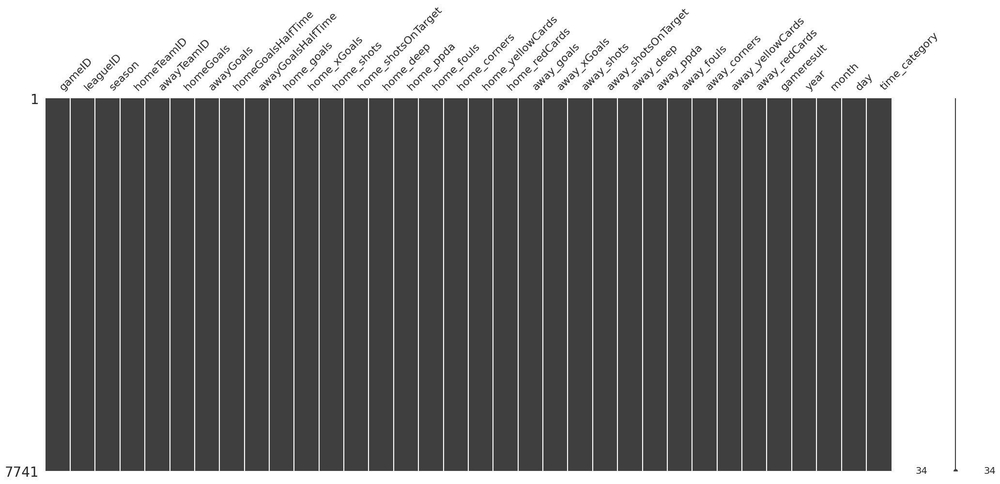

In [200]:
msno.matrix(df_filtered)

In [201]:
df_filtered.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7741 entries, 0 to 12679
Data columns (total 34 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   gameID              7741 non-null   int64  
 1   leagueID            7741 non-null   int64  
 2   season              7741 non-null   int64  
 3   homeTeamID          7741 non-null   int64  
 4   awayTeamID          7741 non-null   int64  
 5   homeGoals           7741 non-null   int64  
 6   awayGoals           7741 non-null   int64  
 7   homeGoalsHalfTime   7741 non-null   int64  
 8   awayGoalsHalfTime   7741 non-null   int64  
 9   home_goals          7741 non-null   int64  
 10  home_xGoals         7741 non-null   float64
 11  home_shots          7741 non-null   int64  
 12  home_shotsOnTarget  7741 non-null   int64  
 13  home_deep           7741 non-null   int64  
 14  home_ppda           7741 non-null   float64
 15  home_fouls          7741 non-null   int64  
 16  home_corne

In [202]:
df_nulls = df.copy()
for col in df_nulls:
    if df_nulls[col].isna().sum() == 0:
        del df_nulls[col]
df_nulls

,home_yellowCards
0,2.0
1,3.0
2,1.0
3,2.0
4,1.0
...,...
12675,2.0
12676,1.0
12677,1.0
12678,1.0


### Missing matrix


In [203]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12680 entries, 0 to 12679
Data columns (total 34 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   gameID              12680 non-null  int64  
 1   leagueID            12680 non-null  int64  
 2   season              12680 non-null  int64  
 3   homeTeamID          12680 non-null  int64  
 4   awayTeamID          12680 non-null  int64  
 5   homeGoals           12680 non-null  int64  
 6   awayGoals           12680 non-null  int64  
 7   homeGoalsHalfTime   12680 non-null  int64  
 8   awayGoalsHalfTime   12680 non-null  int64  
 9   home_goals          12680 non-null  int64  
 10  home_xGoals         12680 non-null  float64
 11  home_shots          12680 non-null  int64  
 12  home_shotsOnTarget  12680 non-null  int64  
 13  home_deep           12680 non-null  int64  
 14  home_ppda           12680 non-null  float64
 15  home_fouls          12680 non-null  int64  
 16  home

In [ ]:
#No Missing Values found

In [204]:
import pickle
with open('gameresult.pkl', 'wb') as f:
    pickle.dump(df_filtered, f)

print("df_filtered saved as a pickle file.")

df_filtered saved as a pickle file.
